<a href="https://colab.research.google.com/github/DSrijon01/Performance_Analysis_pycaret_UNSWNB15N/blob/main/Final_Thesis_%5BClassification%5D_Selected_Features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pycaret
import pycaret

     |████████████████████████████████| 266kB 3.9MB/s 
     |████████████████████████████████| 14.2MB 252kB/s 
     |████████████████████████████████| 174kB 51.1MB/s 
     |████████████████████████████████| 256kB 52.7MB/s 
     |████████████████████████████████| 2.0MB 25.1MB/s 
     |████████████████████████████████| 1.7MB 24.6MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 81kB 9.0MB/s 
     |████████████████████████████████| 276kB 43.4MB/s 
     |████████████████████████████████| 1.4MB 25.1MB/s 
     |████████████████████████████████| 112kB 43.7MB/s 
     |████████████████████████████████| 61kB 7.1MB/s 
     |████████████████████████████████| 6.8MB 28.9MB/s 
     |████████████████████████████████| 81kB 9.4MB/s 
     |████████████████████████████████| 61kB 6.5MB/s 
     |████████████████████████████████| 174kB 50.4MB/s 


In [ ]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
import math, time, random, datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('seaborn')
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import missingno
import pickle

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/Thesis - Train Test Split Datasets/UNSW_NB15_training-set.csv')
test = pd.read_csv('/content/drive/MyDrive/Thesis - Train Test Split Datasets/UNSW_NB15_testing-set.csv')

In [ ]:
train.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,252,254,14158.942380,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,255,0.000000,0.000000,0.000000,43,43,0,0,1,0,1,1,1,1,0,0,0,1,1,0,Normal,0
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,62,252,8395.112305,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,255,0.000000,0.000000,0.000000,52,1106,0,0,43,1,1,1,1,2,0,0,0,1,6,0,Normal,0
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,62,252,1572.271851,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,255,0.111897,0.061458,0.050439,46,824,0,0,7,1,2,1,1,3,0,0,0,2,6,0,Normal,0
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,62,252,2740.178955,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,255,0.000000,0.000000,0.000000,52,64,0,0,1,1,2,1,1,3,1,1,0,2,1,0,Normal,0
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,254,252,8561.499023,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,255,0.128381,0.071147,0.057234,53,45,0,0,43,1,2,2,1,40,0,0,0,2,39,0,Normal,0


In [ ]:
test.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.0902,254,0,180363632.0,0.0,0,0,0.011,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,248,0,0,0,2,2,1,1,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.0003,254,0,881000000.0,0.0,0,0,0.008,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,881,0,0,0,2,2,1,1,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.0051,254,0,854400000.0,0.0,0,0,0.005,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,534,0,0,0,3,2,1,1,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.6608,254,0,600000000.0,0.0,0,0,0.006,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,450,0,0,0,3,2,2,2,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.0025,254,0,850400000.0,0.0,0,0,0.010,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,1063,0,0,0,3,2,2,2,1,3,0,0,0,2,3,0,Normal,0


In [ ]:
print(train.shape)
print(test.shape)

(175341, 45)
(82332, 45)


In [ ]:
train.dtypes

id                     int64
dur                  float64
proto                 object
service               object
state                 object
spkts                  int64
dpkts                  int64
sbytes                 int64
dbytes                 int64
rate                 float64
sttl                   int64
dttl                   int64
sload                float64
dload                float64
sloss                  int64
dloss                  int64
sinpkt               float64
dinpkt               float64
sjit                 float64
djit                 float64
swin                   int64
stcpb                  int64
dtcpb                  int64
dwin                   int64
tcprtt               float64
synack               float64
ackdat               float64
smean                  int64
dmean                  int64
trans_depth            int64
response_body_len      int64
ct_srv_src             int64
ct_state_ttl           int64
ct_dst_ltm             int64
ct_src_dport_l

In [ ]:
train.isnull()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175336,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
175337,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
175338,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
175339,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
train.isnull().sum()

id                   0
dur                  0
proto                0
service              0
state                0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat 

In [ ]:
test.isnull()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82327,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
82328,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
82329,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
82330,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
test.isnull().sum()

id                   0
dur                  0
proto                0
service              0
state                0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat 

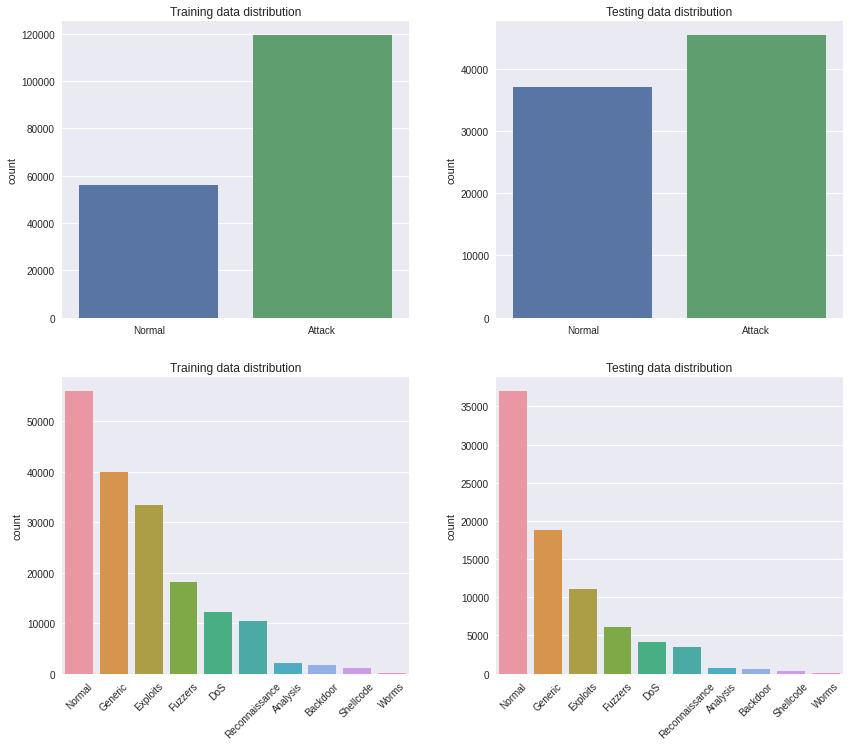

In [ ]:
# Visualise the distribution of attacks and normal traffic

f, axes = plt.subplots(2, 2, figsize=(14, 12))

# Create the plots
sns.countplot(x="label", data=train, ax=axes[0,0])
sns.countplot(x="label", data=test, ax=axes[0,1])
sns.countplot(x="attack_cat", data=train, ax=axes[1,0], order = train['attack_cat'].value_counts().index)
sns.countplot(x="attack_cat", data=test, ax=axes[1,1], order = test['attack_cat'].value_counts().index)

# Set the plot titles
axes[0,0].set_title("Training data distribution")
axes[1,0].set_title("Training data distribution")
axes[0,1].set_title("Testing data distribution")
axes[1,1].set_title("Testing data distribution")

# Rotate xticks for readability
axes[1,0].tick_params('x', labelrotation=45)
axes[1,1].tick_params('x', labelrotation=45)

# Change the xtick labels for attack / normal
axes[0,0].set_xticklabels(["Normal", "Attack"])
axes[0,1].set_xticklabels(["Normal", "Attack"])

# Remove xlabels
axes[0,0].set_xlabel("")
axes[0,1].set_xlabel("")
axes[1,0].set_xlabel("")
axes[1,1].set_xlabel("")

# Add some space between the plots for y labels
plt.subplots_adjust(wspace=0.25)

In [ ]:
train = train.drop('attack_cat', axis=1)

In [ ]:
train = train.drop('id', axis=1)

In [ ]:
drop_columns = ['attack_cat', 'id'] + ['response_body_len', 'spkts', 'ct_flw_http_mthd', 'trans_depth', 'dwin', 'ct_ftp_cmd', 'is_ftp_login']
for df in [train, test]:
    for col in drop_columns:
        if col in df.columns:
            print('Dropping '+col)
            df.drop([col], axis=1, inplace=True)

Dropping response_body_len
Dropping spkts
Dropping ct_flw_http_mthd
Dropping trans_depth
Dropping dwin
Dropping ct_ftp_cmd
Dropping is_ftp_login
Dropping attack_cat
Dropping id
Dropping response_body_len
Dropping spkts
Dropping ct_flw_http_mthd
Dropping trans_depth
Dropping dwin
Dropping ct_ftp_cmd
Dropping is_ftp_login


In [ ]:
train.head()

,dur,proto,service,state,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,tcprtt,synack,ackdat,smean,dmean,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
0,0.121478,tcp,-,FIN,4,258,172,74.087490,252,254,14158.942380,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,0.000000,0.000000,0.000000,43,43,1,0,1,1,1,1,1,1,0,0
1,0.649902,tcp,-,FIN,38,734,42014,78.473372,62,252,8395.112305,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,0.000000,0.000000,0.000000,52,1106,43,1,1,1,1,2,1,6,0,0
2,1.623129,tcp,-,FIN,16,364,13186,14.170161,62,252,1572.271851,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,0.111897,0.061458,0.050439,46,824,7,1,2,1,1,3,2,6,0,0
3,1.681642,tcp,ftp,FIN,12,628,770,13.677108,62,252,2740.178955,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,0.000000,0.000000,0.000000,52,64,1,1,2,1,1,3,2,1,0,0
4,0.449454,tcp,-,FIN,6,534,268,33.373826,254,252,8561.499023,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,0.128381,0.071147,0.057234,53,45,43,1,2,2,1,40,2,39,0,0


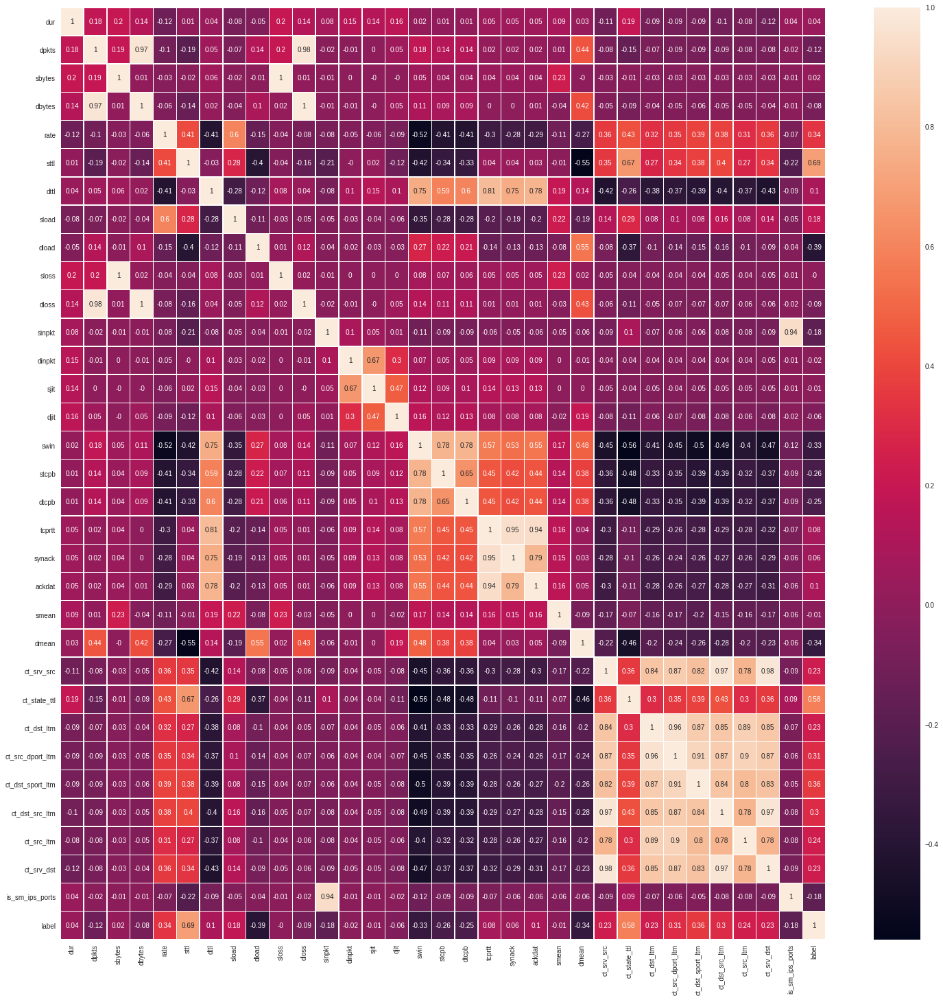

In [ ]:
correlation_matrix = train.corr().round(2)
fig, ax = plt.subplots(figsize=(25,25))
sns.heatmap(correlation_matrix, annot=True, linewidths=.5, ax=ax) #Annot = true; values printed inside square of heatmap

In [ ]:
def top_correlations(correlations, limit=0):
    columns = correlations.columns
    for i in range(correlations.shape[0]):
        for j in range(i+1, correlations.shape[0]):
            if correlations.iloc[i,j] >= limit:
                print(f"{columns[i]} {columns[j]} {correlations.iloc[i,j]}")

In [ ]:
top_correlations(correlation_matrix)

dpkts dbytes 0.97
dpkts dloss 0.98
sbytes sloss 1.0
dbytes dloss 1.0
sinpkt is_sm_ips_ports 0.94
tcprtt synack 0.95
tcprtt ackdat 0.94
ct_srv_src ct_dst_src_ltm 0.97
ct_srv_src ct_srv_dst 0.98
ct_dst_ltm ct_src_dport_ltm 0.96
ct_src_dport_ltm ct_dst_sport_ltm 0.91
ct_src_dport_ltm ct_src_ltm 0.9
ct_dst_src_ltm ct_srv_dst 0.97


Most correlated features are :

spkts, sbytes, sloss

dpkts, dbytes, dloss

sinpkt, is_sm_ips_ports

swin, dwin

tcprtt, synack

ct_srv_src, ct_srv_dst, ct_dst_src_ltm, ct_src_dport_ltm, ct_dst_sport_ltm

is_ftp_login ct_ftp_cmd

In [ ]:
#from pycaret.classification import *
#exp_clf = setup(train, target = 'label')

In [ ]:
from pycaret.classification import *
exp_clf102 = setup(data = train, target = 'label', session_id=123,
                  normalize = True, 
                  transformation = True, 
                  ignore_low_variance = True,
                  remove_multicollinearity = True, multicollinearity_threshold = 0.95,               
                  log_experiment = True, experiment_name = 'credit1')

,Description,Value
0,session_id,123
1,Target,label
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(175341, 36)"
5,Missing Values,False
6,Numeric Features,27
7,Categorical Features,8
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [ ]:
best_model = compare_models(exclude = ['et', 'lightgbm', 'lda', 'qda', 'ridge', 'gpc'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9575,0.9932,0.9758,0.9622,0.9690,0.9014,0.9017,5.300
dt,Decision Tree Classifier,0.9471,0.9411,0.9597,0.9624,0.9611,0.8785,0.8785,0.589
knn,K Neighbors Classifier,0.9458,0.9812,0.9645,0.9561,0.9603,0.8747,0.8747,5.833
gbc,Gradient Boosting Classifier,0.9453,0.9892,0.9823,0.9400,0.9607,0.8710,0.8733,17.311
ada,Ada Boost Classifier,0.9397,0.9879,0.9714,0.9419,0.9564,0.8589,0.8600,3.779
lr,Logistic Regression,0.9392,0.9861,0.9784,0.9353,0.9563,0.8565,0.8588,4.943
svm,SVM - Linear Kernel,0.9364,0.0000,0.9872,0.9245,0.9548,0.8479,0.8533,0.255
nb,Naive Bayes,0.4590,0.9457,0.2050,0.9997,0.3397,0.1416,0.2755,0.063


In [ ]:
general_model_rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9566,0.9931,0.9744,0.9623,0.9683,0.8994,0.8996
1,0.9587,0.9938,0.9743,0.9654,0.9698,0.9045,0.9046
2,0.9578,0.9932,0.9746,0.9638,0.9692,0.9023,0.9025
3,0.9580,0.9936,0.9775,0.9615,0.9694,0.9026,0.9029
4,0.9562,0.9925,0.9765,0.9598,0.9681,0.8982,0.8985
5,0.9561,0.9933,0.9763,0.9599,0.9680,0.8980,0.8984
6,0.9594,0.9933,0.9787,0.9623,0.9704,0.9058,0.9061
7,0.9573,0.9934,0.9741,0.9635,0.9688,0.9012,0.9013
8,0.9575,0.9927,0.9763,0.9618,0.9690,0.9013,0.9016
9,0.9572,0.9927,0.9755,0.9622,0.9688,0.9009,0.9011


In [ ]:
test_rf = create_model('lr', fold = 2)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9387,0.9856,0.9762,0.9364,0.9559,0.8556,0.8576
1,0.9395,0.9862,0.9806,0.9338,0.9566,0.8568,0.8596
Mean,0.9391,0.9859,0.9784,0.9351,0.9563,0.8562,0.8586
SD,0.0004,0.0003,0.0022,0.0013,0.0004,0.0006,0.0010


In [ ]:
plot_model(general_model_rf, plot = 'parameter')

,Parameters
bootstrap,True
ccp_alpha,0.0
class_weight,None
criterion,gini
max_depth,None
max_features,auto
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_impurity_split,None


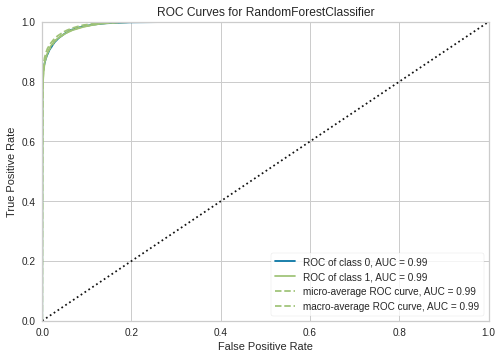

In [ ]:
plot_model(general_model_rf, plot = 'auc')

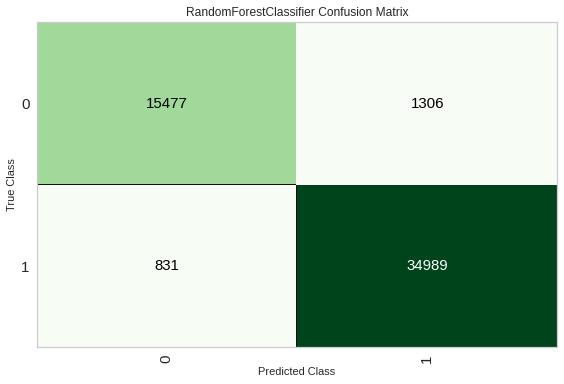

In [ ]:
plot_model(general_model_rf, plot = 'confusion_matrix')

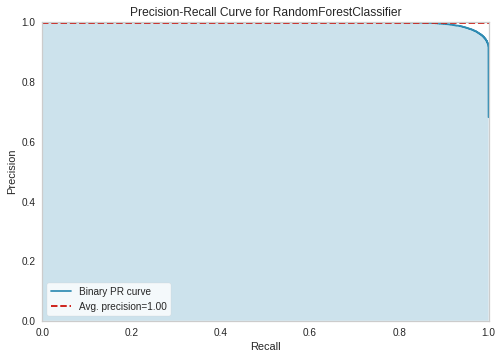

In [ ]:
plot_model(general_model_rf, plot = 'pr')

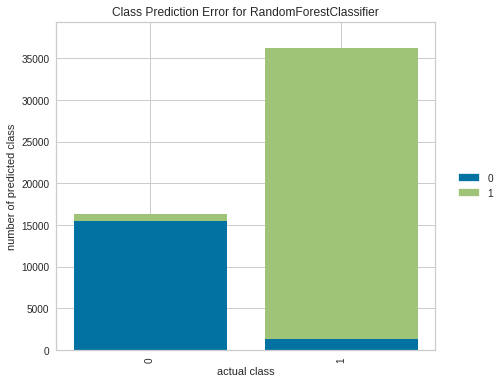

In [ ]:
plot_model(general_model_rf, plot = 'error')

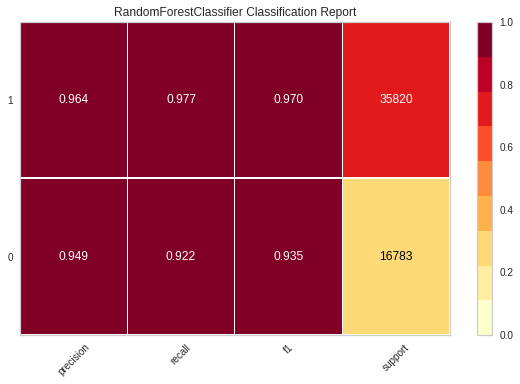

In [ ]:
plot_model(general_model_rf, plot = 'class_report')

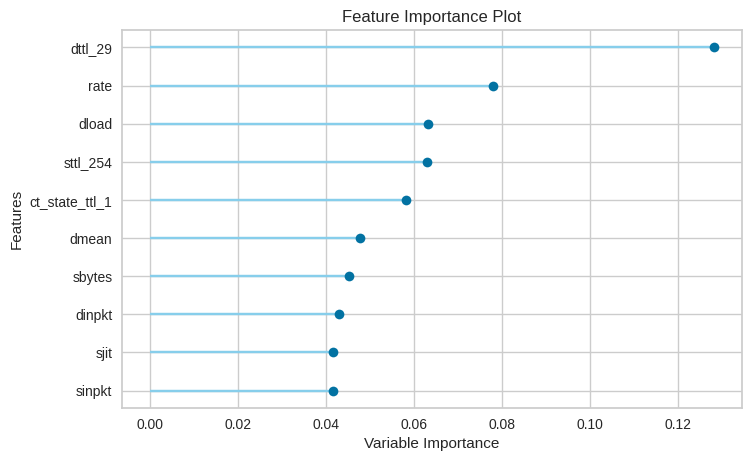

In [ ]:
plot_model(general_model_rf, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(general_model_rf);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9594,0.9936,0.9768,0.964,0.9704,0.9058,0.906


In [ ]:
genera_rf_unseen_predictions = predict_model(general_model_rf, data=test)
genera_rf_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(genera_rf_unseen_predictions['label'], genera_rf_unseen_predictions['Label'], metric = 'Accuracy')

0.8722

In [ ]:
tuned_rf = tune_model(general_model_rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9379,0.9791,0.9847,0.9284,0.9557,0.8522,0.8563
1,0.9352,0.9787,0.9905,0.9203,0.9542,0.8444,0.8510
2,0.9343,0.9786,0.9843,0.9240,0.9532,0.8430,0.8478
3,0.9316,0.9806,0.9897,0.9165,0.9517,0.8354,0.8426
4,0.9351,0.9778,0.9843,0.9251,0.9538,0.8451,0.8497
5,0.9347,0.9785,0.9869,0.9224,0.9536,0.8436,0.8491
6,0.9374,0.9786,0.9855,0.9271,0.9554,0.8508,0.8553
7,0.9309,0.9764,0.9913,0.9144,0.9513,0.8332,0.8412
8,0.9351,0.9789,0.9917,0.9192,0.9541,0.8437,0.8508
9,0.9332,0.9776,0.9914,0.9171,0.9528,0.8390,0.8465


In [ ]:
plot_model(tuned_rf, plot = 'parameter')

,Parameters
bootstrap,False
ccp_alpha,0.0
class_weight,balanced_subsample
criterion,gini
max_depth,4
max_features,sqrt
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0005
min_impurity_split,None


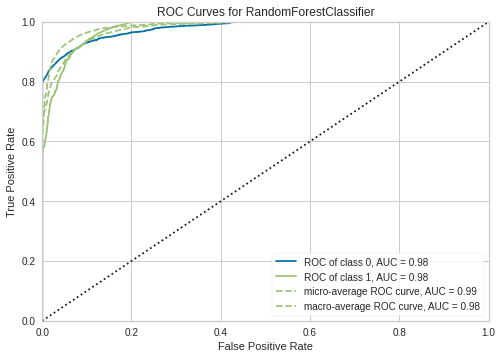

In [ ]:
plot_model(tuned_rf, plot = 'auc')

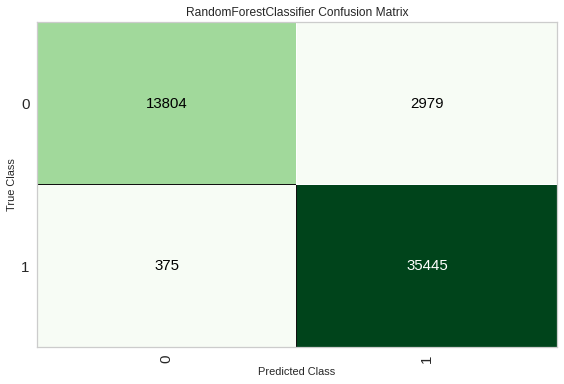

In [ ]:
plot_model(tuned_rf, plot = 'confusion_matrix')

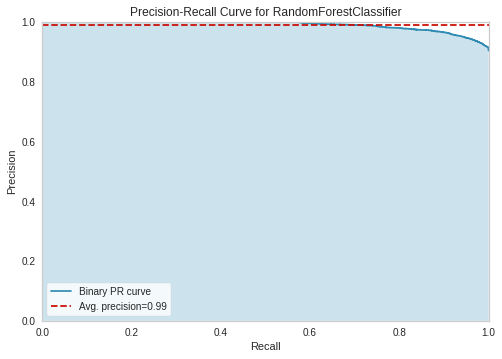

In [ ]:
plot_model(tuned_rf, plot = 'pr')

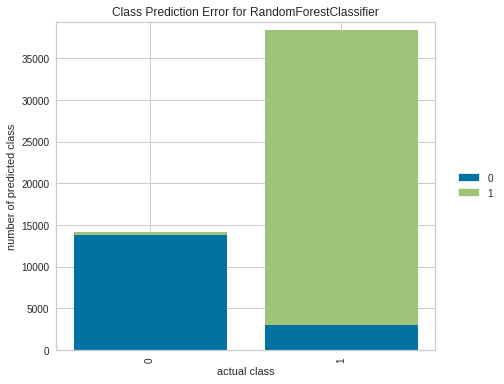

In [ ]:
plot_model(tuned_rf, plot = 'error')

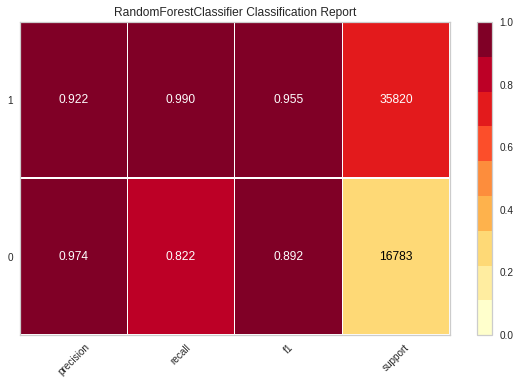

In [ ]:
plot_model(tuned_rf, plot = 'class_report')

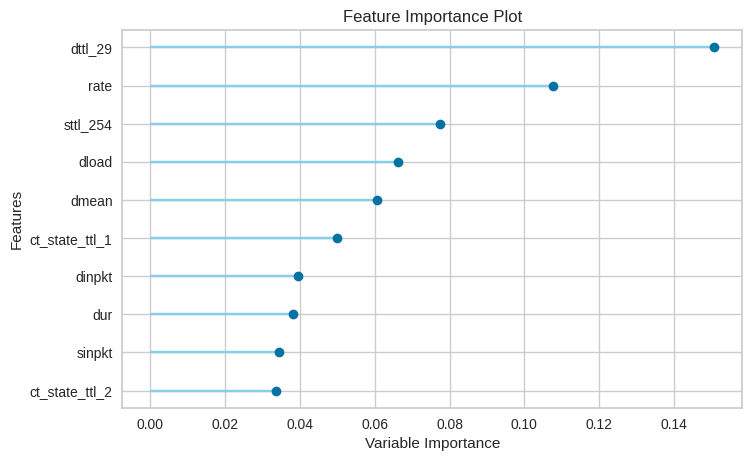

In [ ]:
plot_model(tuned_rf, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(tuned_rf);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9362,0.9791,0.9895,0.9225,0.9548,0.8469,0.853


In [ ]:
tuned_rf_unseen_predictions = predict_model(tuned_rf, data=test)
tuned_rf_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(tuned_rf_unseen_predictions['label'], tuned_rf_unseen_predictions['Label'], metric = 'Accuracy')

0.8178

In [ ]:
# DT


general_model_dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9484,0.9435,0.9597,0.9644,0.9620,0.8817,0.8818
1,0.9488,0.9444,0.9597,0.9650,0.9623,0.8827,0.8827
2,0.9484,0.9419,0.9617,0.9625,0.9621,0.8815,0.8815
3,0.9488,0.9419,0.9626,0.9621,0.9624,0.8821,0.8821
4,0.9468,0.9394,0.9608,0.9610,0.9609,0.8777,0.8777
5,0.9477,0.9423,0.9592,0.9638,0.9615,0.8800,0.8801
6,0.9492,0.9433,0.9616,0.9638,0.9627,0.8834,0.8834
7,0.9447,0.9384,0.9585,0.9602,0.9593,0.8729,0.8729
8,0.9447,0.9377,0.9591,0.9596,0.9593,0.8728,0.8728
9,0.9433,0.9382,0.9547,0.9616,0.9582,0.8701,0.8702


In [ ]:
plot_model(general_model_dt, plot = 'parameter')

,Parameters
ccp_alpha,0.0
class_weight,None
criterion,gini
max_depth,None
max_features,None
max_leaf_nodes,None
min_impurity_decrease,0.0
min_impurity_split,None
min_samples_leaf,1
min_samples_split,2


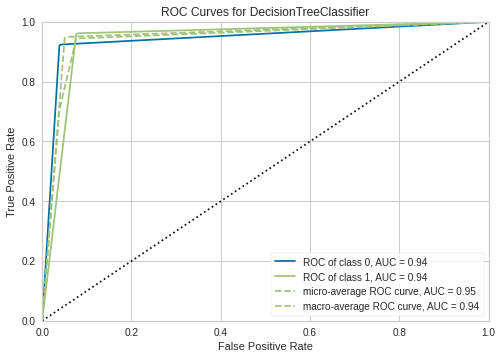

In [ ]:
plot_model(general_model_dt, plot = 'auc')

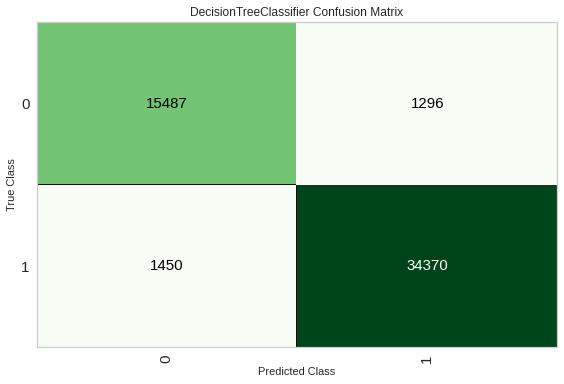

In [ ]:
plot_model(general_model_dt, plot = 'confusion_matrix')

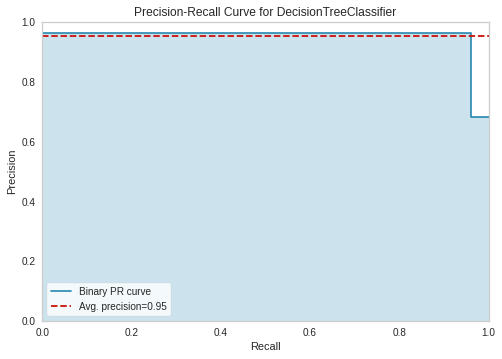

In [ ]:
plot_model(general_model_dt, plot = 'pr')

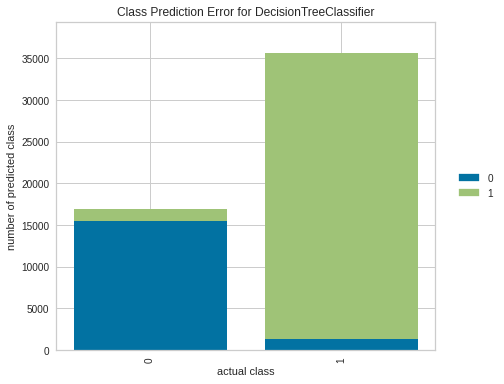

In [ ]:
plot_model(general_model_dt, plot = 'error')

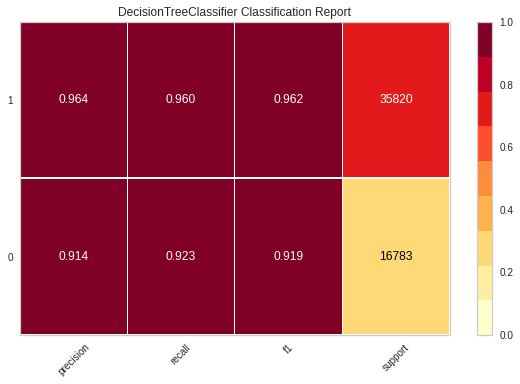

In [ ]:
plot_model(general_model_dt, plot = 'class_report')

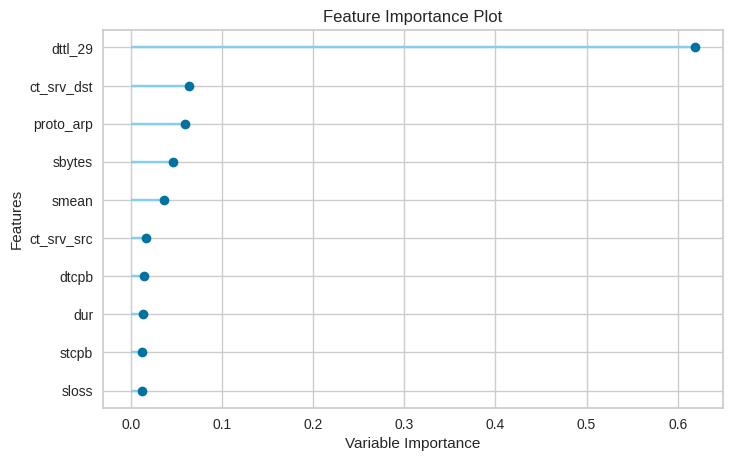

In [ ]:
plot_model(general_model_dt, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(general_model_dt);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9478,0.9426,0.9595,0.9637,0.9616,0.8802,0.8802


In [ ]:
genera_dt_unseen_predictions = predict_model(general_model_dt, data=test)
genera_dt_unseen_predictions.head()

from pycaret.utils import check_metric
check_metric(genera_dt_unseen_predictions['label'], genera_dt_unseen_predictions['Label'], metric = 'Accuracy')

0.8637

In [ ]:
tuned_dt = tune_model(general_model_dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9408,0.9841,0.9568,0.9562,0.9565,0.8637,0.8637
1,0.9427,0.9813,0.9666,0.9501,0.9583,0.8670,0.8673
2,0.9427,0.9820,0.9679,0.9489,0.9583,0.8668,0.8672
3,0.9456,0.9839,0.9714,0.9498,0.9605,0.8732,0.8738
4,0.9418,0.9830,0.9676,0.9480,0.9577,0.8647,0.8651
5,0.9413,0.9834,0.9713,0.9441,0.9575,0.8629,0.8638
6,0.9445,0.9852,0.9656,0.9534,0.9595,0.8715,0.8717
7,0.9394,0.9821,0.9764,0.9371,0.9564,0.8572,0.8592
8,0.9446,0.9812,0.9713,0.9486,0.9598,0.8708,0.8715
9,0.9400,0.9823,0.9632,0.9494,0.9563,0.8609,0.8612


In [ ]:
plot_model(tuned_dt, plot = 'parameter')

,Parameters
ccp_alpha,0.0
class_weight,None
criterion,gini
max_depth,14
max_features,log2
max_leaf_nodes,None
min_impurity_decrease,0
min_impurity_split,None
min_samples_leaf,2
min_samples_split,7


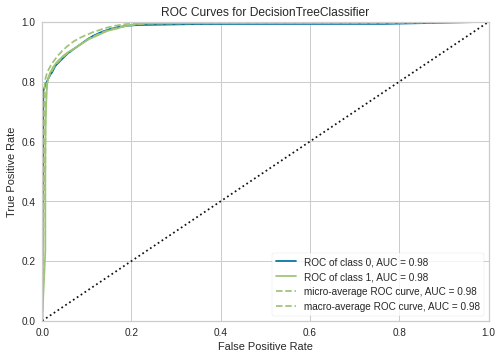

In [ ]:
plot_model(tuned_dt, plot = 'auc')

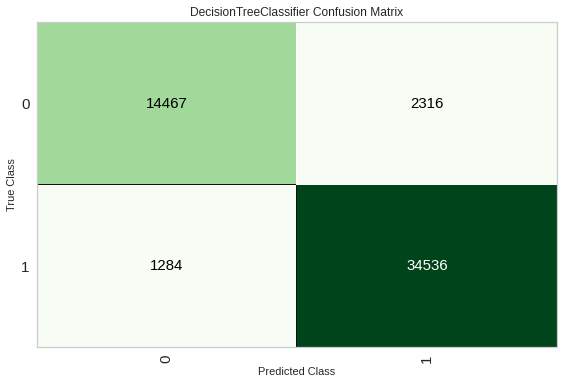

In [ ]:
plot_model(tuned_dt, plot = 'confusion_matrix')

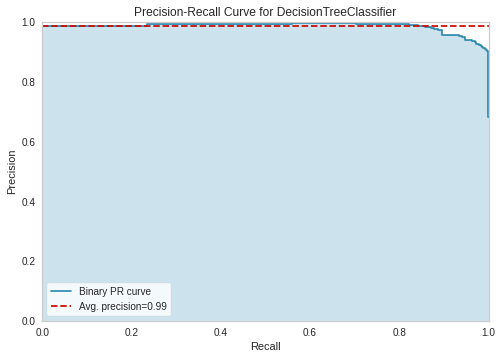

In [ ]:
plot_model(tuned_dt, plot = 'pr')

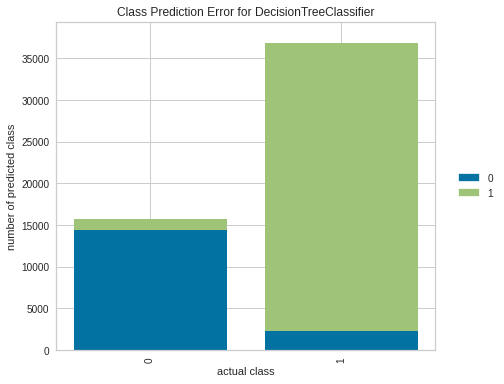

In [ ]:
plot_model(tuned_dt, plot = 'error')

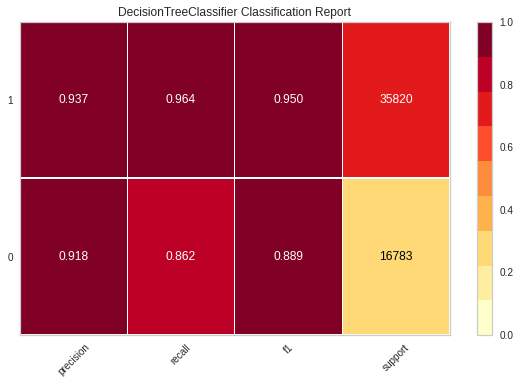

In [ ]:
plot_model(tuned_dt, plot = 'class_report')

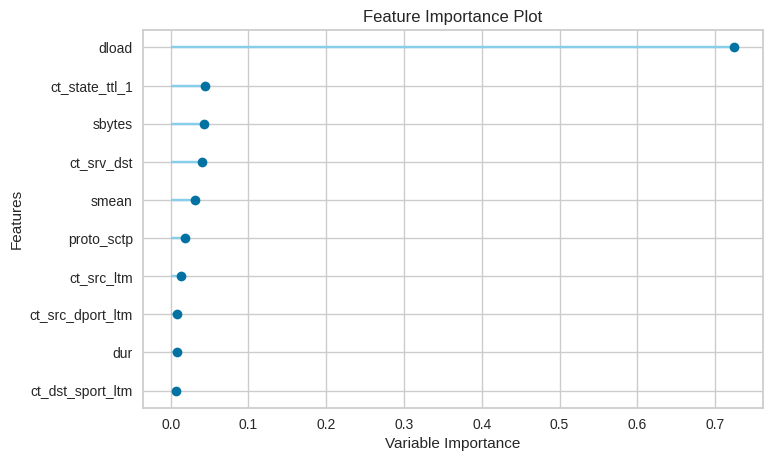

In [ ]:
plot_model(tuned_dt, plot = 'feature')

In [ ]:

# Predict on Test/Hold Sample

predict_model(tuned_dt);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9316,0.9784,0.9642,0.9372,0.9505,0.8399,0.8408


In [ ]:
tuned_dt_unseen_predictions = predict_model(tuned_dt, data=test)
tuned_dt_unseen_predictions.head()
check_metric(tuned_dt_unseen_predictions['label'], tuned_dt_unseen_predictions['Label'], metric = 'Accuracy')

0.8551

In [ ]:
# GBC


general_model_gbc = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9464,0.9899,0.9808,0.9427,0.9614,0.8738,0.8757
1,0.9456,0.9892,0.9819,0.9407,0.9609,0.8717,0.8738
2,0.9439,0.9889,0.9823,0.9381,0.9597,0.8674,0.8699
3,0.9473,0.9899,0.9832,0.9419,0.9621,0.8757,0.8779
4,0.9451,0.9887,0.9810,0.9409,0.9605,0.8706,0.8727
5,0.9435,0.9895,0.9829,0.9371,0.9594,0.8663,0.8690
6,0.9459,0.9888,0.9819,0.9411,0.9611,0.8725,0.8746
7,0.9432,0.9882,0.9836,0.9362,0.9593,0.8656,0.8684
8,0.9459,0.9895,0.9826,0.9405,0.9611,0.8723,0.8746
9,0.9467,0.9891,0.9831,0.9412,0.9617,0.8743,0.8765


In [ ]:
plot_model(general_model_gbc, plot = 'parameter')

,Parameters
ccp_alpha,0.0
criterion,friedman_mse
init,None
learning_rate,0.1
loss,deviance
max_depth,3
max_features,None
max_leaf_nodes,None
min_impurity_decrease,0.0
min_impurity_split,None


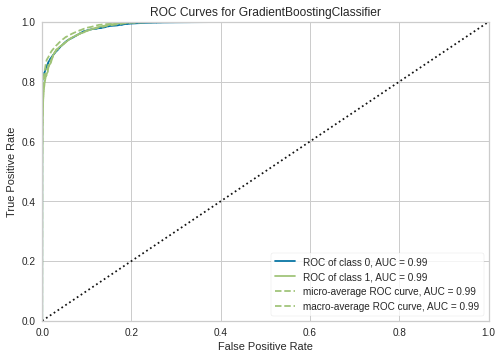

In [ ]:
plot_model(general_model_gbc, plot = 'auc')

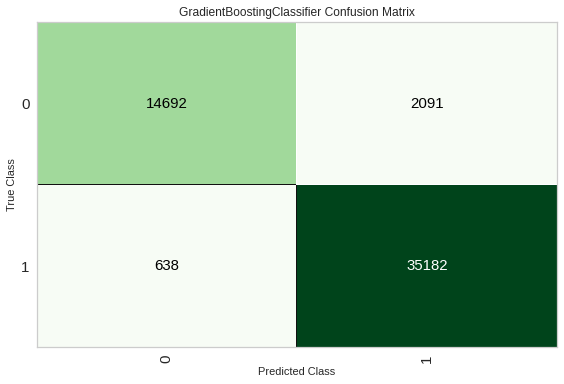

In [ ]:
plot_model(general_model_gbc, plot = 'confusion_matrix')

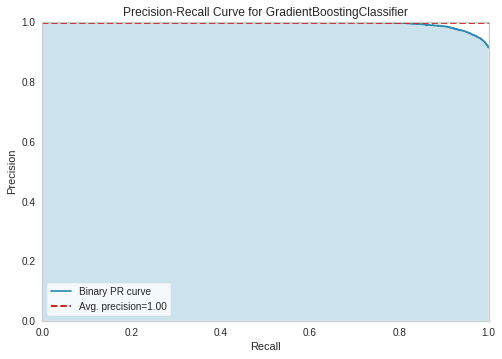

In [ ]:
plot_model(general_model_gbc, plot = 'pr')

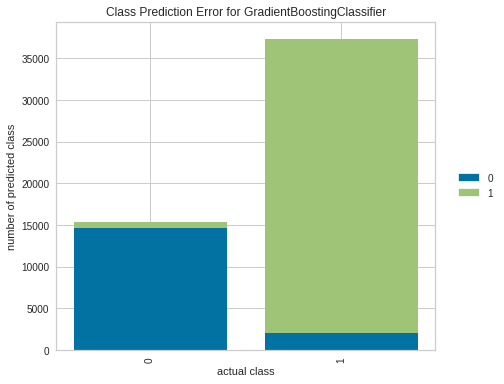

In [ ]:
plot_model(general_model_gbc, plot = 'error')

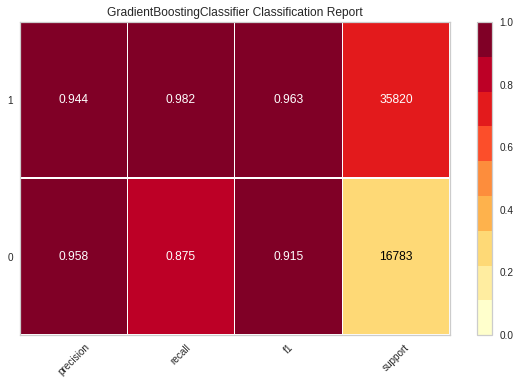

In [ ]:
plot_model(general_model_gbc, plot = 'class_report')

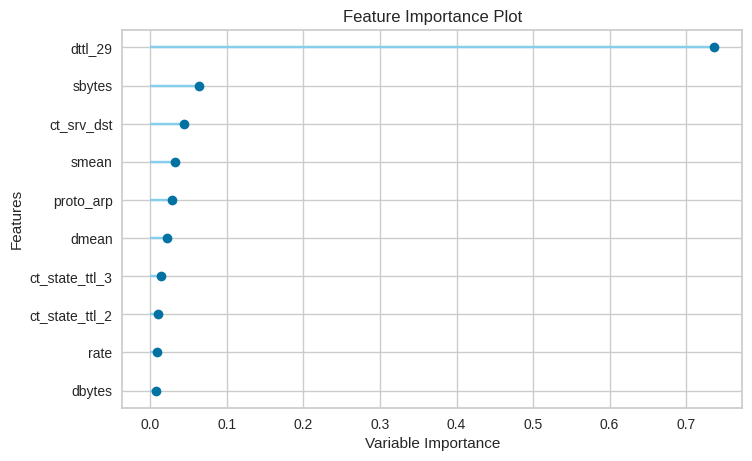

In [ ]:
plot_model(general_model_gbc, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(general_model_gbc);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9481,0.9897,0.9822,0.9439,0.9627,0.8778,0.8797


In [ ]:
genera_gbc_unseen_predictions = predict_model(general_model_gbc, data=test)
genera_gbc_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(genera_gbc_unseen_predictions['label'], genera_gbc_unseen_predictions['Label'], metric = 'Accuracy')

0.8545

In [ ]:
tuned_gbc = tune_model(general_model_gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9597,0.9938,0.9782,0.9631,0.9706,0.9064,0.9067
1,0.9606,0.9941,0.9767,0.9658,0.9712,0.9087,0.9089
2,0.9552,0.9931,0.9750,0.9598,0.9673,0.8960,0.8963
3,0.9604,0.9941,0.9773,0.9650,0.9711,0.9083,0.9085
4,0.9556,0.9933,0.9756,0.9598,0.9676,0.8969,0.8972
5,0.9580,0.9940,0.9777,0.9613,0.9694,0.9026,0.9029
6,0.9587,0.9939,0.9777,0.9622,0.9699,0.9041,0.9044
7,0.9577,0.9935,0.9753,0.9630,0.9691,0.9020,0.9022
8,0.9585,0.9937,0.9784,0.9613,0.9698,0.9037,0.9040
9,0.9593,0.9935,0.9773,0.9634,0.9703,0.9055,0.9058


In [ ]:
plot_model(tuned_gbc, plot = 'parameter')

,Parameters
ccp_alpha,0.0
criterion,friedman_mse
init,None
learning_rate,0.15
loss,deviance
max_depth,7
max_features,1.0
max_leaf_nodes,None
min_impurity_decrease,0.02
min_impurity_split,None


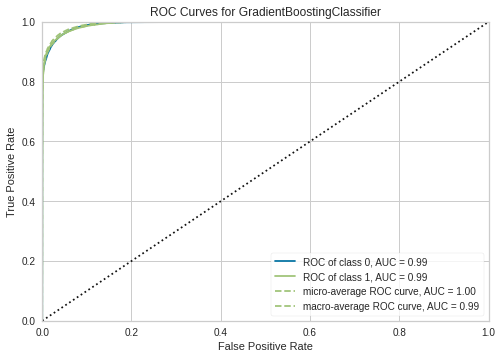

In [ ]:
plot_model(tuned_gbc, plot = 'auc')

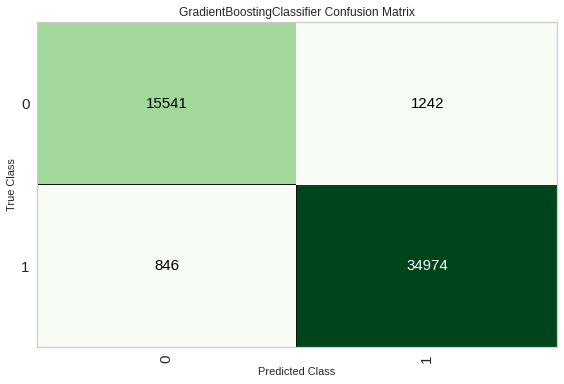

In [ ]:
plot_model(tuned_gbc, plot = 'confusion_matrix')

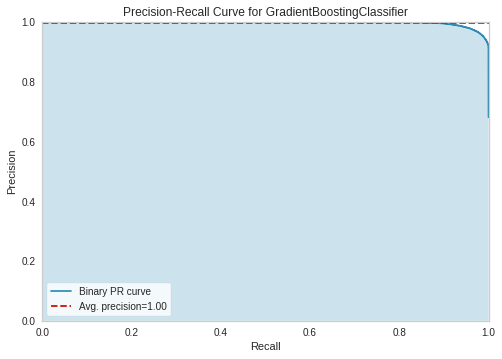

In [ ]:
plot_model(tuned_gbc, plot = 'pr')

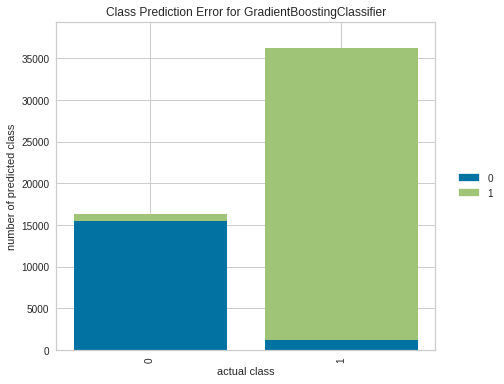

In [ ]:
plot_model(tuned_gbc, plot = 'error')

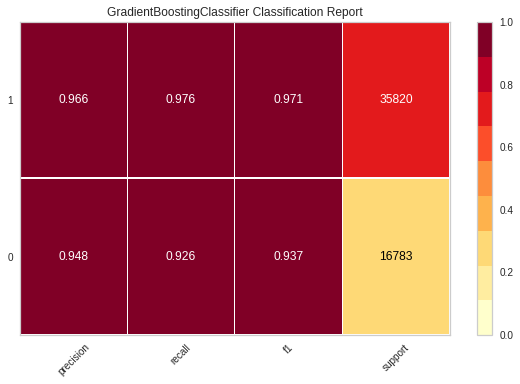

In [ ]:
plot_model(tuned_gbc, plot = 'class_report')

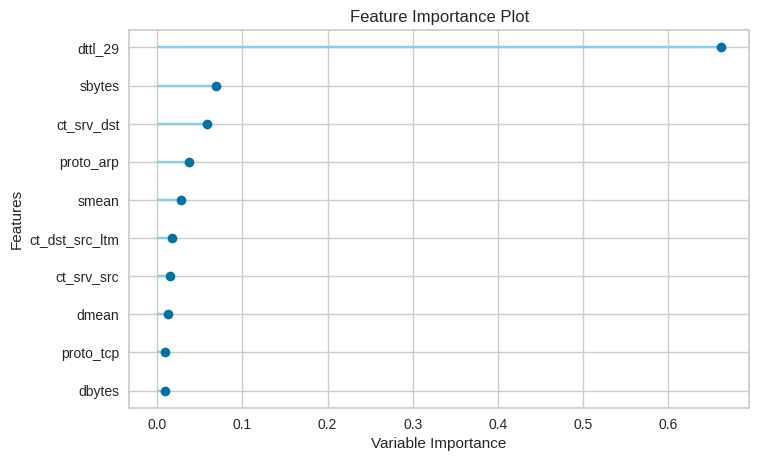

In [ ]:
plot_model(tuned_gbc, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(tuned_gbc);


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9603,0.994,0.9764,0.9657,0.971,0.9081,0.9082


In [ ]:
tuned_gbc_unseen_predictions = predict_model(tuned_gbc, data=test)
tuned_gbc_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(tuned_gbc_unseen_predictions['label'], tuned_gbc_unseen_predictions['Label'], metric = 'Accuracy')

0.8729

In [ ]:
# ADA


general_model_ada = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9395,0.9882,0.9701,0.9426,0.9562,0.8585,0.8594
1,0.9399,0.9877,0.9702,0.9431,0.9564,0.8595,0.8604
2,0.9353,0.9869,0.9668,0.9398,0.9531,0.8488,0.8497
3,0.9419,0.9890,0.9683,0.9475,0.9578,0.8647,0.8653
4,0.9396,0.9873,0.9715,0.9416,0.9563,0.8586,0.8597
5,0.9399,0.9887,0.9723,0.9412,0.9565,0.8591,0.8603
6,0.9422,0.9881,0.9726,0.9441,0.9581,0.8647,0.8657
7,0.9365,0.9870,0.9747,0.9347,0.9543,0.8502,0.8522
8,0.9428,0.9887,0.9720,0.9455,0.9586,0.8663,0.8672
9,0.9399,0.9876,0.9752,0.9388,0.9567,0.8586,0.8603


In [ ]:
# Predict on Test/Hold Sample

predict_model(general_model_ada);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.9414,0.9883,0.9726,0.9431,0.9576,0.8627,0.8638


In [ ]:
plot_model(general_model_ada, plot = 'parameter')

,Parameters
algorithm,SAMME.R
base_estimator,None
learning_rate,1.0
n_estimators,50
random_state,123


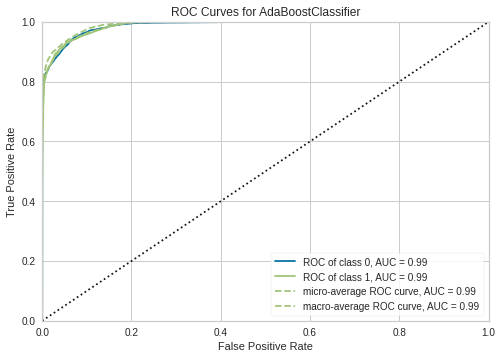

In [ ]:
plot_model(general_model_ada, plot = 'auc')

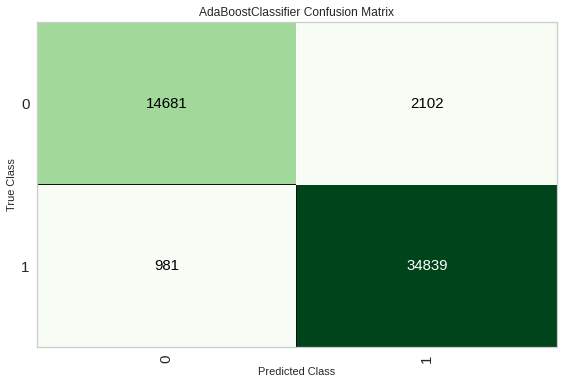

In [ ]:
plot_model(general_model_ada, plot = 'confusion_matrix')

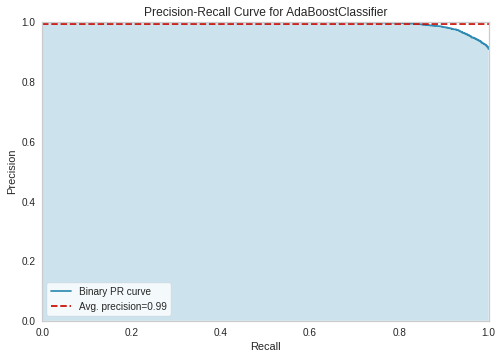

In [ ]:
plot_model(general_model_ada, plot = 'pr')

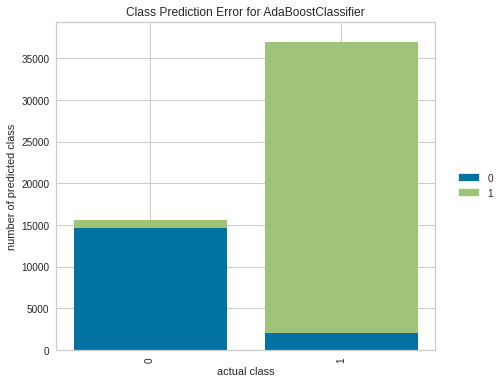

In [ ]:
plot_model(general_model_ada, plot = 'error')

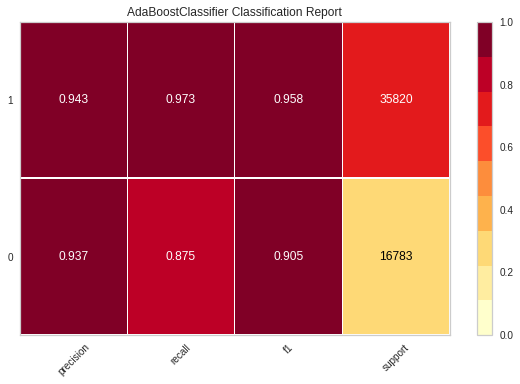

In [ ]:
plot_model(general_model_ada, plot = 'class_report')

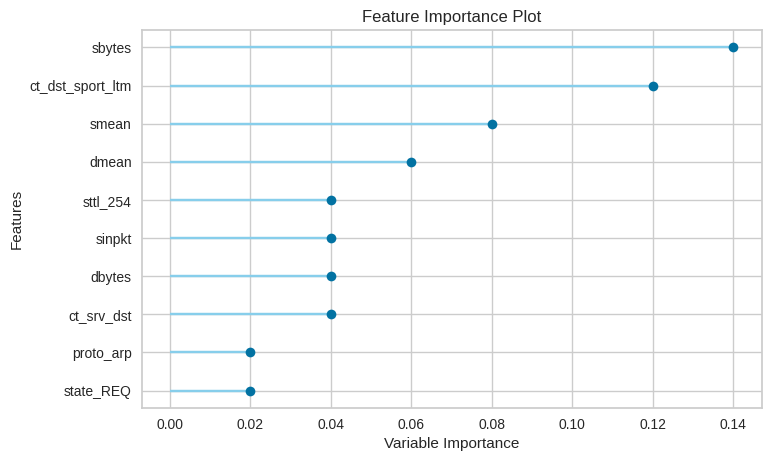

In [ ]:
plot_model(general_model_ada, plot = 'feature')

In [ ]:
genera_ada_unseen_predictions = predict_model(general_model_ada, data=test)
genera_ada_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(genera_ada_unseen_predictions['label'], genera_ada_unseen_predictions['Label'], metric = 'Accuracy')

0.8486

In [ ]:
tuned_ada = tune_model(general_model_ada)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9417,0.9888,0.9790,0.9379,0.9581,0.8625,0.8646
1,0.9384,0.9879,0.9787,0.9340,0.9558,0.8544,0.8570
2,0.9382,0.9880,0.9805,0.9323,0.9558,0.8537,0.8567
3,0.9406,0.9889,0.9813,0.9347,0.9574,0.8595,0.8622
4,0.9401,0.9875,0.9812,0.9341,0.9571,0.8583,0.8611
5,0.9381,0.9885,0.9804,0.9321,0.9556,0.8533,0.8563
6,0.9417,0.9883,0.9795,0.9375,0.9581,0.8624,0.8646
7,0.9395,0.9876,0.9811,0.9335,0.9567,0.8568,0.8597
8,0.9416,0.9887,0.9819,0.9354,0.9581,0.8618,0.8645
9,0.9413,0.9879,0.9814,0.9354,0.9579,0.8610,0.8637


In [ ]:
plot_model(tuned_ada, plot = 'parameter')

,Parameters
algorithm,SAMME.R
base_estimator,None
learning_rate,0.2
n_estimators,230
random_state,123


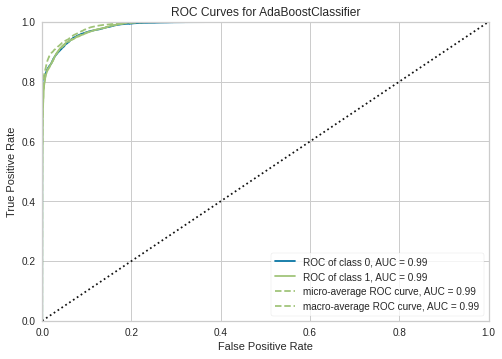

In [ ]:
plot_model(tuned_ada, plot = 'auc')

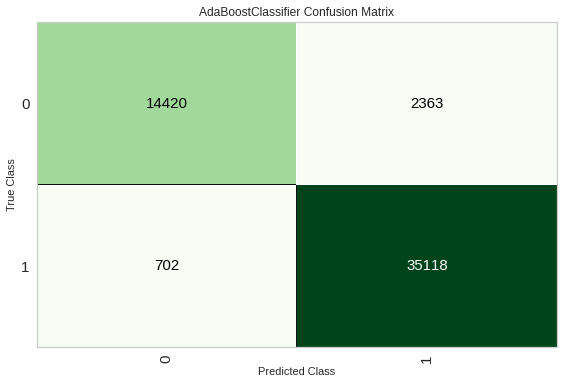

In [ ]:
plot_model(tuned_ada, plot = 'confusion_matrix')

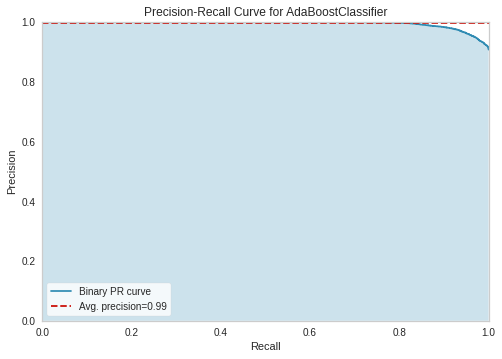

In [ ]:
plot_model(tuned_ada, plot = 'pr')

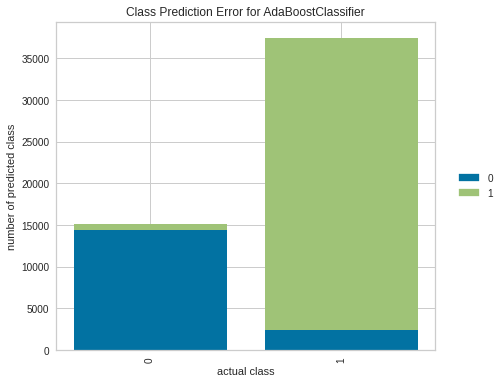

In [ ]:
plot_model(tuned_ada, plot = 'error')

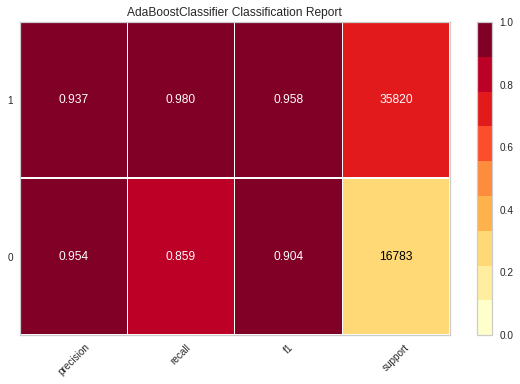

In [ ]:
plot_model(tuned_ada, plot = 'class_report')

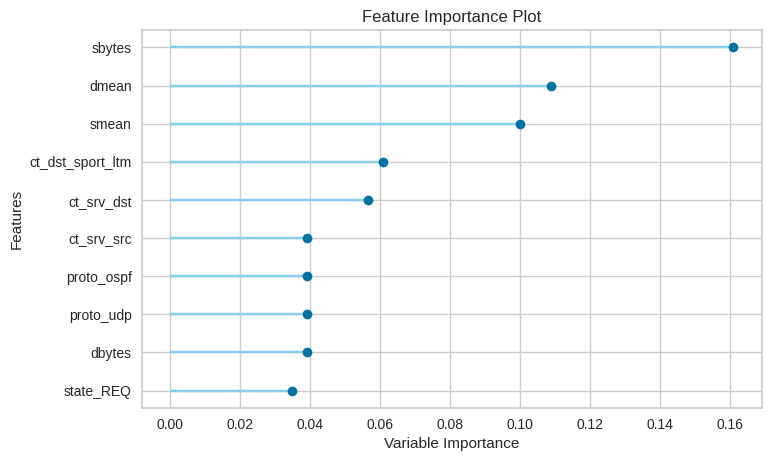

In [ ]:
plot_model(tuned_ada, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(tuned_ada);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.9417,0.9886,0.9804,0.937,0.9582,0.8623,0.8647


In [ ]:
tuned_ada_unseen_predictions = predict_model(tuned_ada, data=test)
tuned_ada_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(tuned_ada_unseen_predictions['label'], tuned_ada_unseen_predictions['Label'], metric = 'Accuracy')

0.8414

In [ ]:
# KNN


general_model_knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9458,0.9805,0.9636,0.9571,0.9603,0.8749,0.8750
1,0.9467,0.9816,0.9626,0.9592,0.9609,0.8772,0.8772
2,0.9432,0.9813,0.9604,0.9564,0.9584,0.8691,0.8691
3,0.9461,0.9818,0.9660,0.9554,0.9606,0.8754,0.8755
4,0.9453,0.9810,0.9630,0.9568,0.9599,0.8736,0.8737
5,0.9431,0.9822,0.9642,0.9528,0.9585,0.8683,0.8685
6,0.9488,0.9820,0.9662,0.9589,0.9625,0.8818,0.8819
7,0.9448,0.9816,0.9667,0.9529,0.9598,0.8721,0.8723
8,0.9474,0.9801,0.9668,0.9564,0.9616,0.8784,0.8785
9,0.9462,0.9799,0.9658,0.9557,0.9607,0.8756,0.8757


In [ ]:
plot_model(general_model_knn, plot = 'parameter')

,Parameters
algorithm,auto
leaf_size,30
metric,minkowski
metric_params,None
n_jobs,-1
n_neighbors,5
p,2
weights,uniform


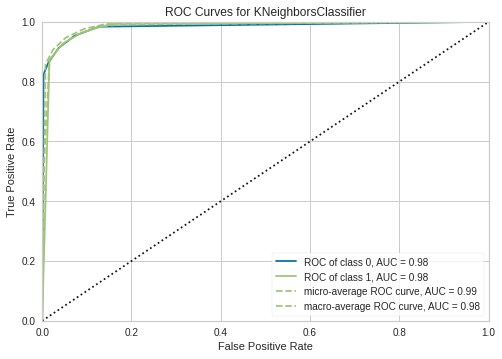

In [ ]:
plot_model(general_model_knn, plot = 'auc')

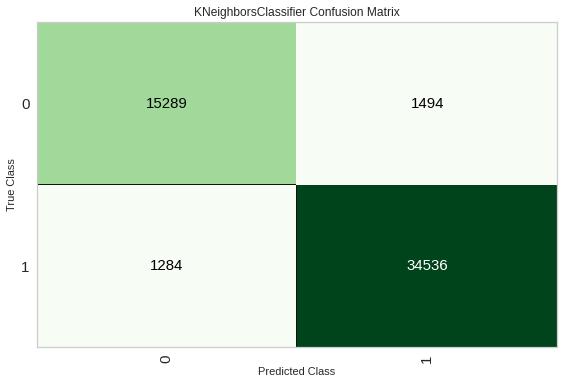

In [ ]:
plot_model(general_model_knn, plot = 'confusion_matrix')

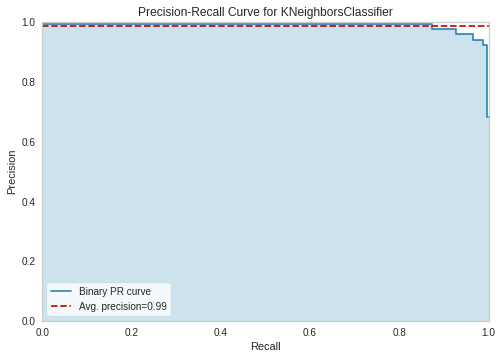

In [ ]:
plot_model(general_model_knn, plot = 'pr')

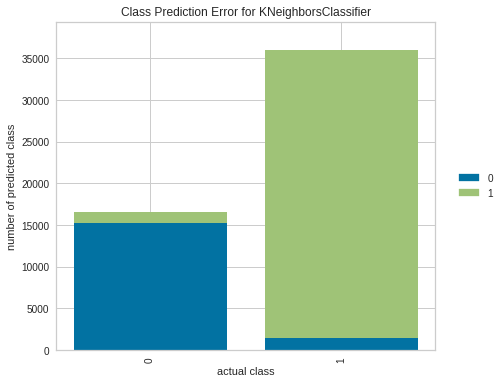

In [ ]:
plot_model(general_model_knn, plot = 'error')

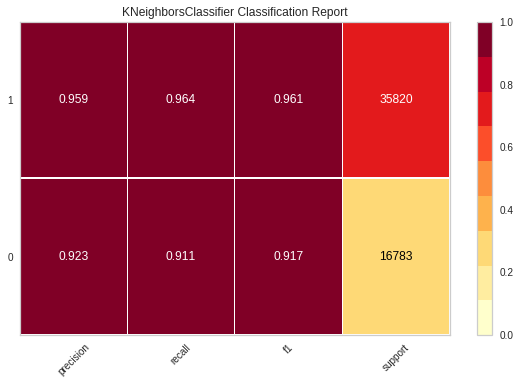

In [ ]:
plot_model(general_model_knn, plot = 'class_report')

In [ ]:
plot_model(general_model_knn, plot = 'feature')

TypeError: ignored

In [ ]:
# Predict on Test/Hold Sample

predict_model(general_model_knn);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.9472,0.9827,0.9642,0.9585,0.9613,0.8781,0.8781


In [ ]:
genera_knn_unseen_predictions = predict_model(general_model_knn, data=test)
genera_knn_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(genera_knn_unseen_predictions['label'], genera_knn_unseen_predictions['Label'], metric = 'Accuracy')

0.8621

In [ ]:
tuned_knn = tune_model(general_model_knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9540,0.9886,0.9710,0.9618,0.9664,0.8938,0.8939
1,0.9530,0.9897,0.9683,0.9629,0.9656,0.8916,0.8916
2,0.9496,0.9890,0.9676,0.9588,0.9632,0.8836,0.8837
3,0.9531,0.9904,0.9717,0.9598,0.9657,0.8913,0.8915
4,0.9510,0.9885,0.9693,0.9591,0.9642,0.8867,0.8868
5,0.9524,0.9905,0.9729,0.9578,0.9653,0.8896,0.8899
6,0.9547,0.9892,0.9705,0.9632,0.9668,0.8954,0.8954
7,0.9505,0.9877,0.9682,0.9594,0.9638,0.8855,0.8856
8,0.9537,0.9887,0.9713,0.9611,0.9662,0.8929,0.8931
9,0.9523,0.9882,0.9698,0.9604,0.9651,0.8896,0.8897


In [ ]:
plot_model(tuned_knn, plot = 'parameter')

,Parameters
algorithm,auto
leaf_size,30
metric,manhattan
metric_params,None
n_jobs,-1
n_neighbors,13
p,2
weights,distance


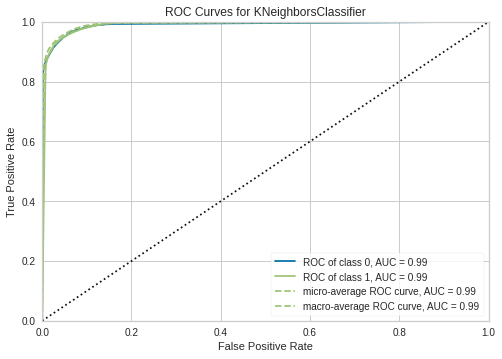

In [ ]:
plot_model(tuned_knn, plot = 'auc')

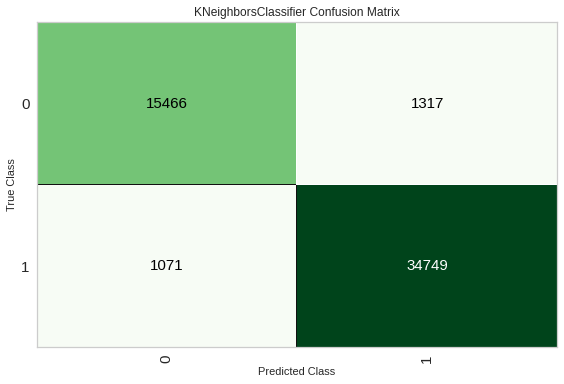

In [ ]:
plot_model(tuned_knn, plot = 'confusion_matrix')

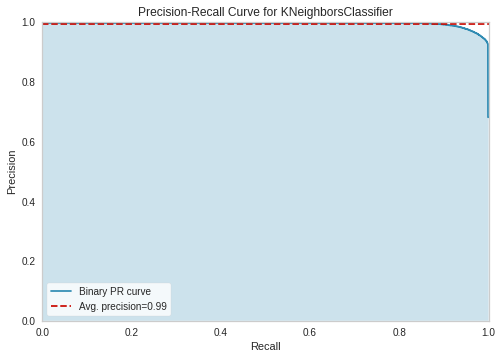

In [ ]:
plot_model(tuned_knn, plot = 'pr')

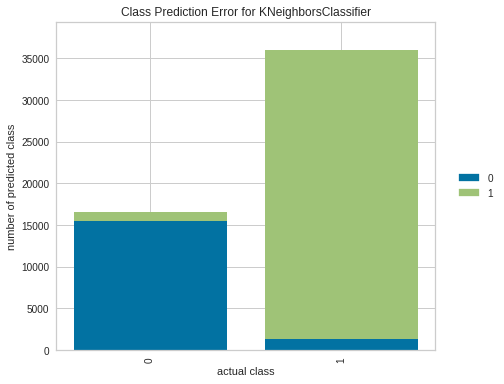

In [ ]:
plot_model(tuned_knn, plot = 'error')

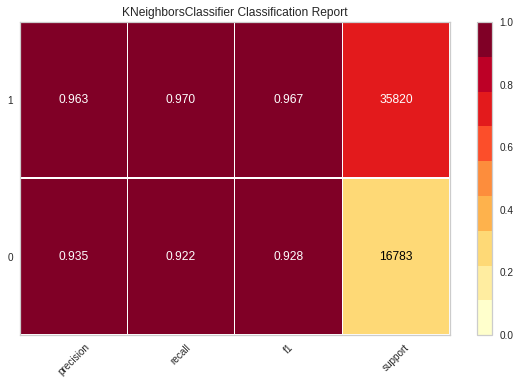

In [ ]:
plot_model(tuned_knn, plot = 'class_report')

In [ ]:
plot_model(tuned_knn, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(tuned_knn);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.9546,0.9895,0.9701,0.9635,0.9668,0.8951,0.8952


In [ ]:
tuned_knn_unseen_predictions = predict_model(tuned_knn, data=test)
tuned_knn_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(tuned_knn_unseen_predictions['label'], tuned_knn_unseen_predictions['Label'], metric = 'Accuracy')

0.8646

In [ ]:
# LR

general_model_lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9404,0.9868,0.9757,0.9391,0.9571,0.8600,0.8616
1,0.9395,0.9858,0.9776,0.9364,0.9565,0.8574,0.8596
2,0.9385,0.9859,0.9770,0.9355,0.9558,0.8549,0.8571
3,0.9386,0.9867,0.9778,0.9349,0.9559,0.8550,0.8573
4,0.9369,0.9845,0.9777,0.9327,0.9547,0.8507,0.8533
5,0.9394,0.9867,0.9799,0.9342,0.9565,0.8567,0.8593
6,0.9395,0.9862,0.9798,0.9345,0.9566,0.8569,0.8595
7,0.9384,0.9859,0.9810,0.9321,0.9559,0.8540,0.8571
8,0.9420,0.9868,0.9790,0.9384,0.9583,0.8632,0.8653
9,0.9390,0.9855,0.9784,0.9349,0.9562,0.8559,0.8583


In [ ]:
plot_model(general_model_lr, plot = 'parameter')

,Parameters
C,1.0
class_weight,None
dual,False
fit_intercept,True
intercept_scaling,1
l1_ratio,None
max_iter,1000
multi_class,auto
n_jobs,None
penalty,l2


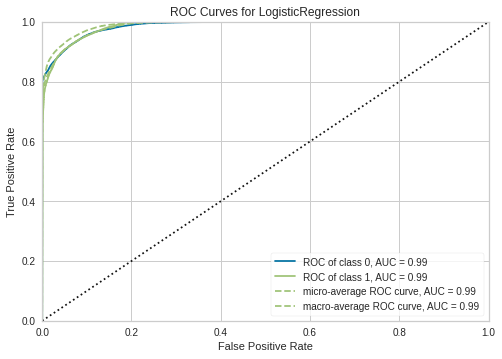

In [ ]:
plot_model(general_model_lr, plot = 'auc')

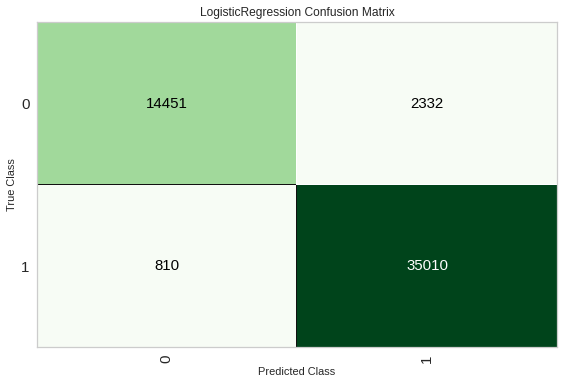

In [ ]:
plot_model(general_model_lr, plot = 'confusion_matrix')

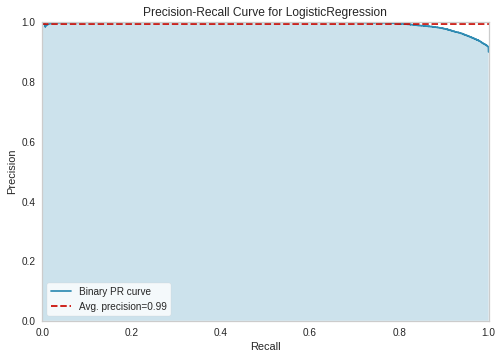

In [ ]:
plot_model(general_model_lr, plot = 'pr')

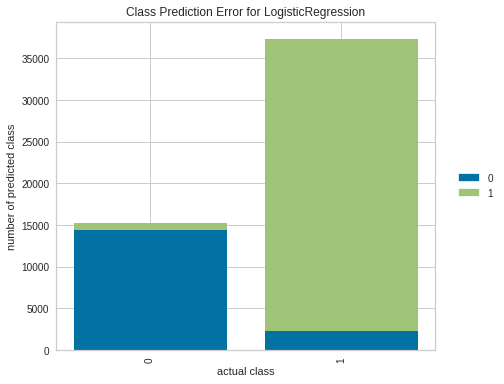

In [ ]:
plot_model(general_model_lr, plot = 'error')

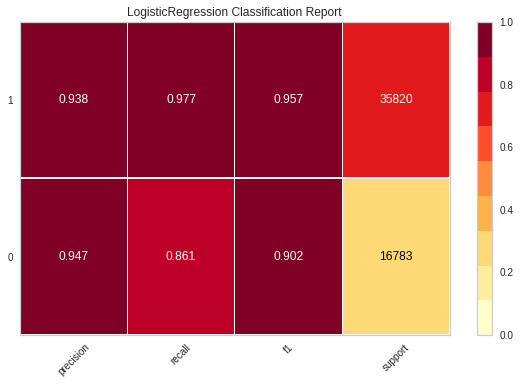

In [ ]:
plot_model(general_model_lr, plot = 'class_report')

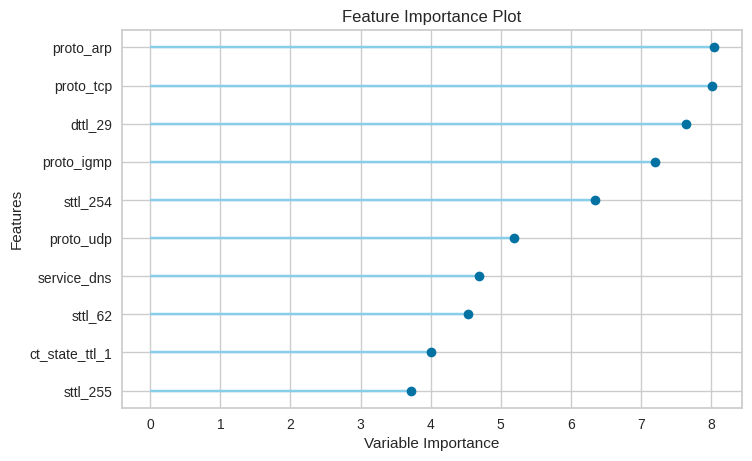

In [ ]:
plot_model(general_model_lr, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(general_model_lr);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9403,0.9863,0.9774,0.9376,0.9571,0.8591,0.8611


In [ ]:
genera_lr_unseen_predictions = predict_model(general_model_lr, data=test)
genera_lr_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(genera_lr_unseen_predictions['label'], genera_lr_unseen_predictions['Label'], metric = 'Accuracy')

0.8358

In [ ]:
tuned_lr = tune_model(general_model_lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9409,0.9870,0.9758,0.9397,0.9574,0.8612,0.8628
1,0.9395,0.9860,0.9771,0.9366,0.9565,0.8573,0.8594
2,0.9387,0.9860,0.9774,0.9355,0.9560,0.8555,0.8577
3,0.9382,0.9868,0.9776,0.9345,0.9556,0.8540,0.8564
4,0.9369,0.9848,0.9773,0.9331,0.9547,0.8508,0.8533
5,0.9400,0.9869,0.9802,0.9348,0.9570,0.8582,0.8609
6,0.9400,0.9864,0.9802,0.9348,0.9570,0.8582,0.8609
7,0.9382,0.9862,0.9801,0.9325,0.9557,0.8535,0.8565
8,0.9424,0.9869,0.9792,0.9388,0.9586,0.8642,0.8663
9,0.9384,0.9855,0.9778,0.9347,0.9558,0.8545,0.8569


In [ ]:
plot_model(tuned_lr, plot = 'parameter')

,Parameters
C,6.718000000000001
class_weight,{}
dual,False
fit_intercept,True
intercept_scaling,1
l1_ratio,None
max_iter,1000
multi_class,auto
n_jobs,None
penalty,l2


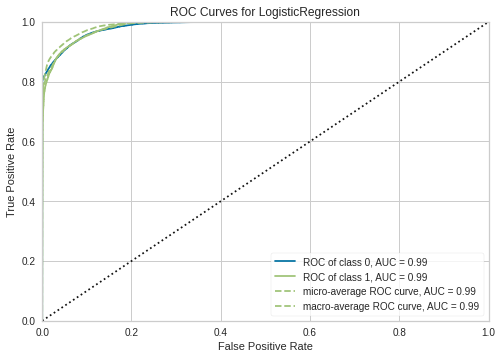

In [ ]:
plot_model(tuned_lr, plot = 'auc')

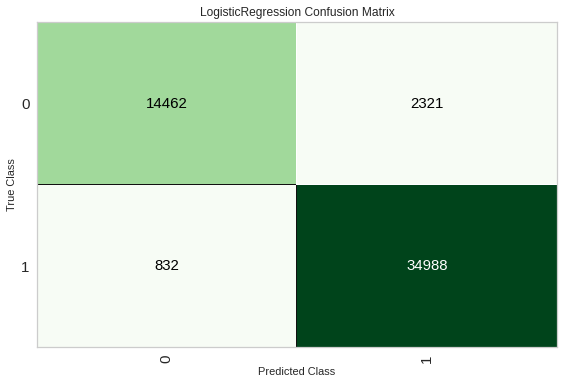

In [ ]:
plot_model(tuned_lr, plot = 'confusion_matrix')

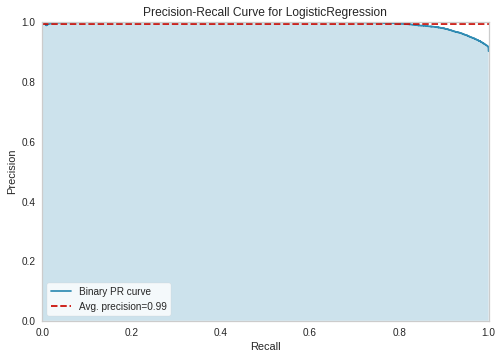

In [ ]:
plot_model(tuned_lr, plot = 'pr')

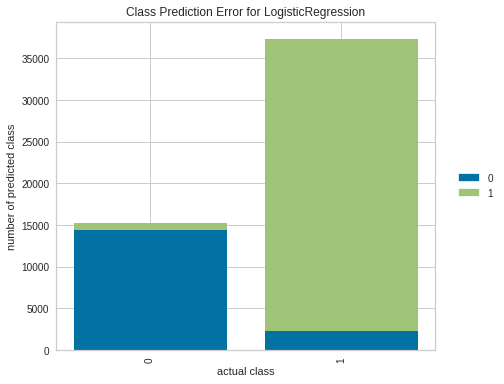

In [ ]:
plot_model(tuned_lr, plot = 'error')

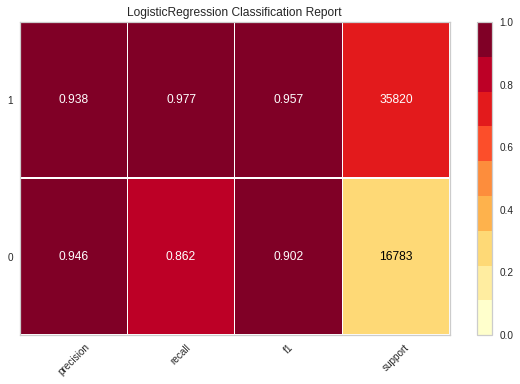

In [ ]:
plot_model(tuned_lr, plot = 'class_report')

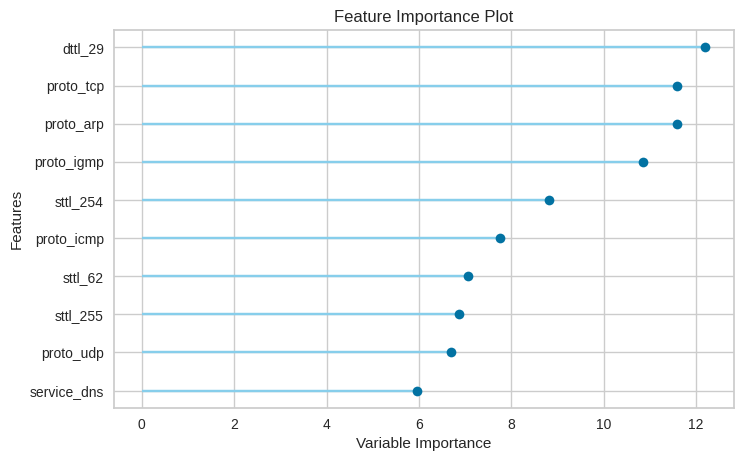

In [ ]:
plot_model(tuned_lr, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(tuned_lr);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9401,0.9866,0.9768,0.9378,0.9569,0.8587,0.8606


In [ ]:
tuned_lr_unseen_predictions = predict_model(tuned_lr, data=test)
tuned_lr_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(tuned_lr_unseen_predictions['label'], tuned_lr_unseen_predictions['Label'], metric = 'Accuracy')

0.8369

In [ ]:
general_model_nb = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.4646,0.9468,0.2132,0.9994,0.3515,0.1475,0.2819
1,0.4642,0.9467,0.2125,1.0000,0.3505,0.1471,0.2818
2,0.4312,0.9454,0.1643,0.9993,0.2822,0.1114,0.2426
3,0.4633,0.9465,0.2113,1.0000,0.3489,0.1462,0.2808
4,0.4611,0.9468,0.2081,0.9994,0.3445,0.1436,0.2779
5,0.4571,0.9433,0.2021,1.0000,0.3363,0.1393,0.2736
6,0.4337,0.9480,0.1679,0.9993,0.2874,0.1140,0.2456
7,0.4809,0.9405,0.2373,1.0000,0.3836,0.1658,0.3007
8,0.4655,0.9476,0.2146,1.0000,0.3533,0.1486,0.2833
9,0.4685,0.9448,0.2190,1.0000,0.3593,0.1519,0.2867


In [ ]:
plot_model(general_model_nb, plot = 'parameter')

,Parameters
priors,None
var_smoothing,1e-09


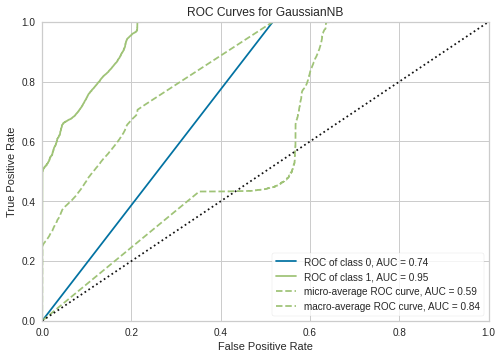

In [ ]:
plot_model(general_model_nb, plot = 'auc')

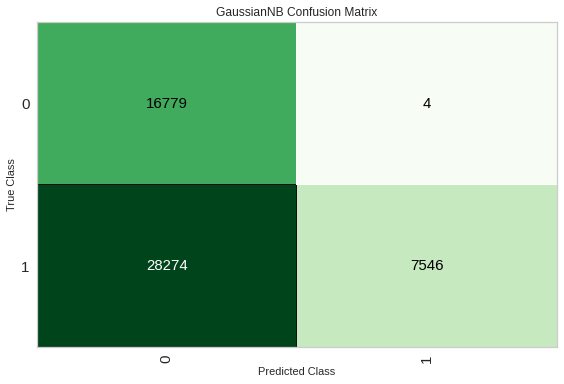

In [ ]:
plot_model(general_model_nb, plot = 'confusion_matrix')

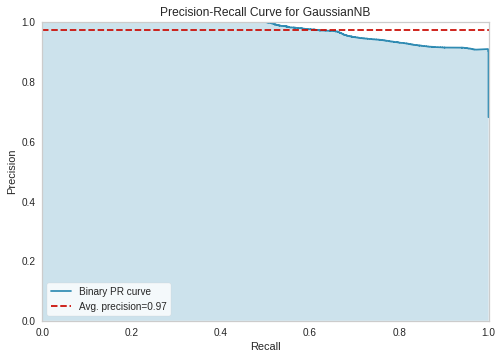

In [ ]:
plot_model(general_model_nb, plot = 'pr')

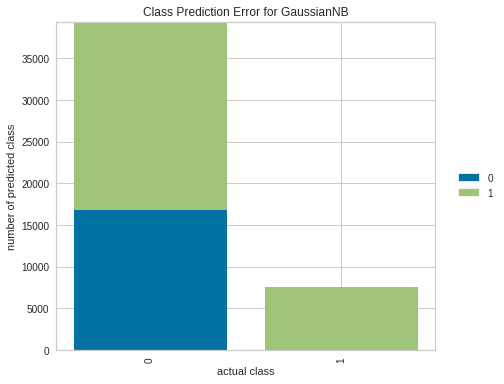

In [ ]:
plot_model(general_model_nb, plot = 'error')

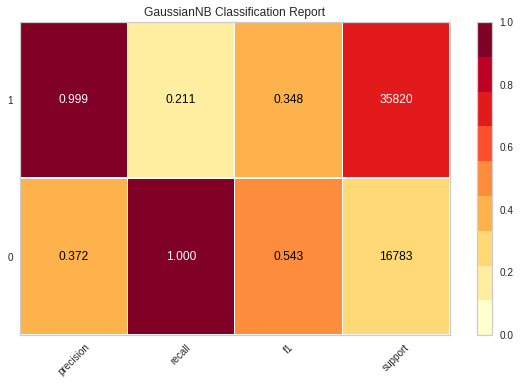

In [ ]:
plot_model(general_model_nb, plot = 'class_report')

In [ ]:
plot_model(general_model_nb, plot = 'feature')

TypeError: ignored

In [ ]:
# Predict on Test/Hold Sample

predict_model(general_model_nb);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,0.4624,0.9473,0.2107,0.9995,0.348,0.1454,0.2797


In [ ]:
genera_nb_unseen_predictions = predict_model(general_model_nb, data=test)
genera_nb_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(genera_nb_unseen_predictions['label'], genera_nb_unseen_predictions['Label'], metric = 'Accuracy')

0.5593

In [ ]:
tuned_nb = tune_model(general_model_nb)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8278,0.9336,0.8252,0.9133,0.8670,0.6244,0.6309
1,0.8300,0.9357,0.8324,0.9102,0.8695,0.6272,0.6324
2,0.8348,0.9345,0.8417,0.9087,0.8739,0.6352,0.6392
3,0.8336,0.9352,0.8398,0.9087,0.8729,0.6330,0.6371
4,0.8376,0.9376,0.8427,0.9120,0.8760,0.6420,0.6462
5,0.8333,0.9325,0.8410,0.9073,0.8729,0.6319,0.6357
6,0.8378,0.9368,0.8429,0.9120,0.8761,0.6423,0.6465
7,0.8214,0.9266,0.8271,0.9023,0.8631,0.6077,0.6125
8,0.8339,0.9361,0.8349,0.9137,0.8725,0.6358,0.6412
9,0.8317,0.9340,0.8357,0.9097,0.8711,0.6300,0.6348


In [ ]:
plot_model(tuned_nb, plot = 'parameter')

,Parameters
priors,None
var_smoothing,0.007


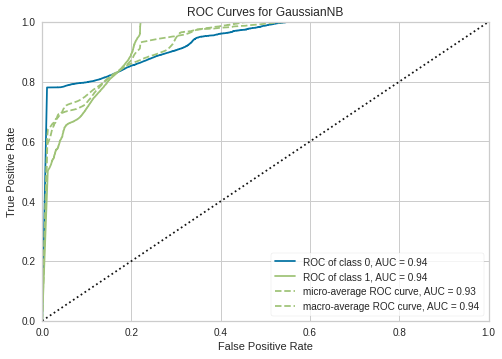

In [ ]:
plot_model(tuned_nb, plot = 'auc')

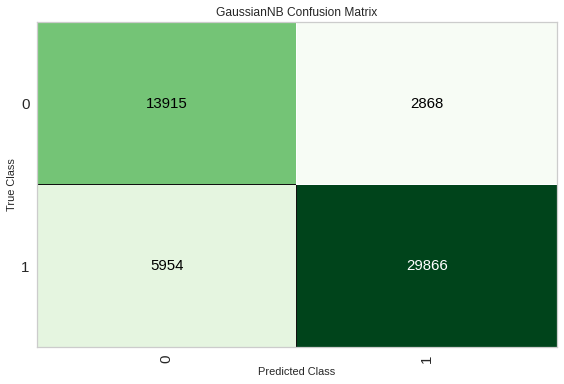

In [ ]:
plot_model(tuned_nb, plot = 'confusion_matrix')

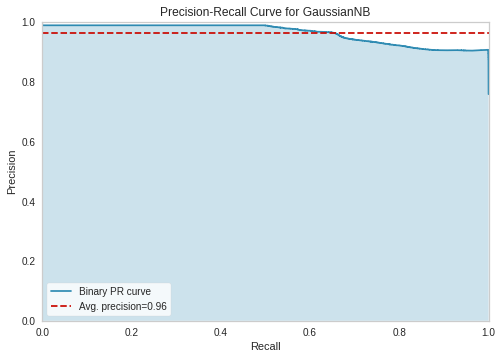

In [ ]:
plot_model(tuned_nb, plot = 'pr')

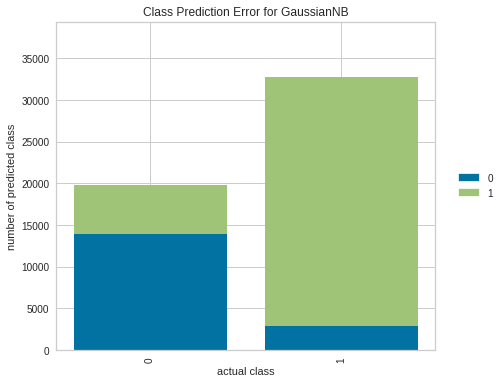

In [ ]:
plot_model(tuned_nb, plot = 'error')

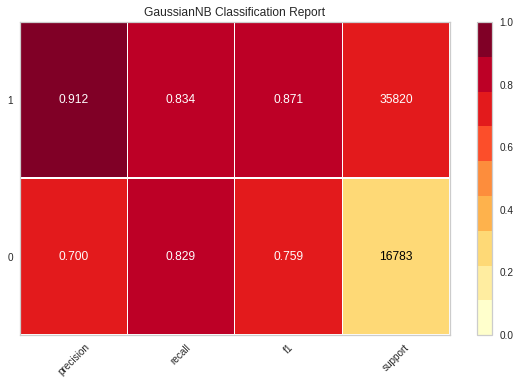

In [ ]:
plot_model(tuned_nb, plot = 'class_report')

In [ ]:
# Predict on Test/Hold Sample

predict_model(tuned_nb);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,0.8323,0.9369,0.8338,0.9124,0.8713,0.632,0.6373


In [ ]:
tuned_nb_unseen_predictions = predict_model(tuned_nb, data=test)
tuned_nb_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(tuned_nb_unseen_predictions['label'], tuned_nb_unseen_predictions['Label'], metric = 'Accuracy')

0.7386

In [ ]:
# SVM


general_model_svm = create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9386,0.0,0.9922,0.9232,0.9565,0.8525,0.8589
1,0.9366,0.0,0.9849,0.9266,0.9548,0.8489,0.8533
2,0.9363,0.0,0.9911,0.9212,0.9549,0.8469,0.8535
3,0.9345,0.0,0.9848,0.9239,0.9534,0.8436,0.8484
4,0.9346,0.0,0.9925,0.9180,0.9538,0.8423,0.8499
5,0.9381,0.0,0.9801,0.9323,0.9556,0.8534,0.8563
6,0.9373,0.0,0.9807,0.9309,0.9552,0.8514,0.8546
7,0.9346,0.0,0.9945,0.9165,0.9539,0.8419,0.8503
8,0.9382,0.0,0.9891,0.9253,0.9561,0.8522,0.8576
9,0.9353,0.0,0.9824,0.9269,0.9538,0.8460,0.8500


In [ ]:
plot_model(general_model_svm, plot = 'parameter')

,Parameters
alpha,0.0001
average,False
class_weight,None
early_stopping,False
epsilon,0.1
eta0,0.001
fit_intercept,True
l1_ratio,0.15
learning_rate,optimal
loss,hinge


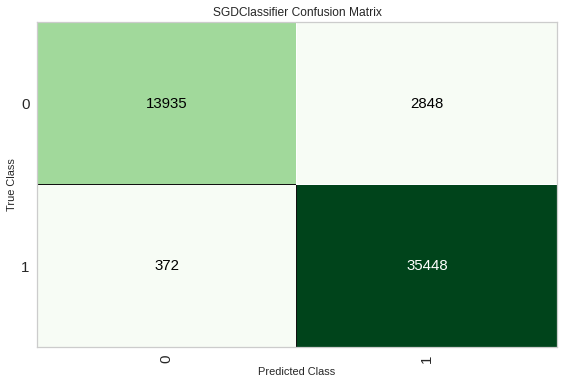

In [ ]:
plot_model(general_model_svm, plot = 'confusion_matrix')

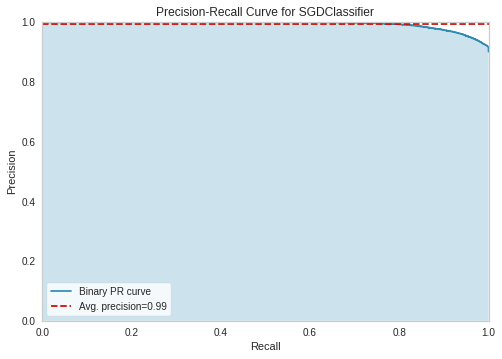

In [ ]:
plot_model(general_model_svm, plot = 'pr')

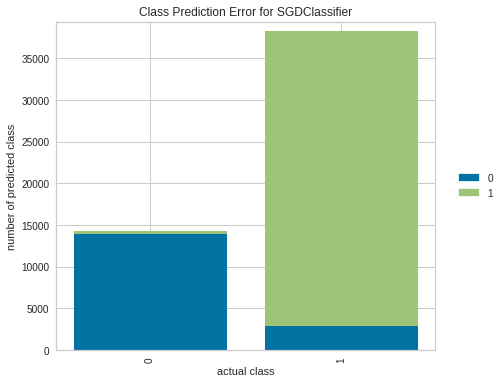

In [ ]:
plot_model(general_model_svm, plot = 'error')

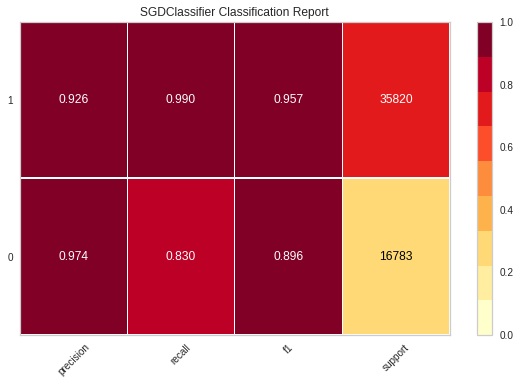

In [ ]:
plot_model(general_model_svm, plot = 'class_report')

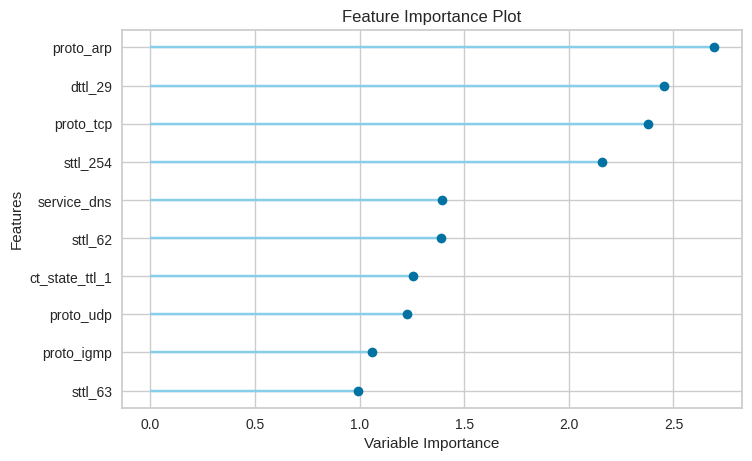

In [ ]:
plot_model(general_model_svm, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(general_model_svm);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9388,0.91,0.9896,0.9256,0.9566,0.8534,0.8589


In [ ]:
genera_svm_unseen_predictions = predict_model(general_model_svm, data=test)
genera_svm_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(genera_svm_unseen_predictions['label'], genera_svm_unseen_predictions['Label'], metric = 'Accuracy')

0.8206

In [ ]:
tuned_svm = tune_model(general_model_svm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9382,0.0,0.9990,0.9175,0.9566,0.8505,0.8597
1,0.9348,0.0,0.9992,0.9132,0.9543,0.8417,0.8521
2,0.9334,0.0,0.9995,0.9112,0.9533,0.8379,0.8489
3,0.9317,0.0,0.9995,0.9092,0.9522,0.8337,0.8452
4,0.9339,0.0,0.9981,0.9129,0.9536,0.8396,0.8498
5,0.9323,0.0,1.0000,0.9095,0.9526,0.8350,0.8466
6,0.9353,0.0,0.9993,0.9137,0.9546,0.8429,0.8532
7,0.9308,0.0,0.9999,0.9078,0.9516,0.8312,0.8433
8,0.9359,0.0,0.9993,0.9144,0.9550,0.8444,0.8545
9,0.9332,0.0,0.9992,0.9112,0.9532,0.8375,0.8484


In [ ]:
plot_model(tuned_svm, plot = 'parameter')

,Parameters
alpha,1e-07
average,False
class_weight,None
early_stopping,False
epsilon,0.1
eta0,0.5
fit_intercept,True
l1_ratio,0.7700000001
learning_rate,adaptive
loss,hinge


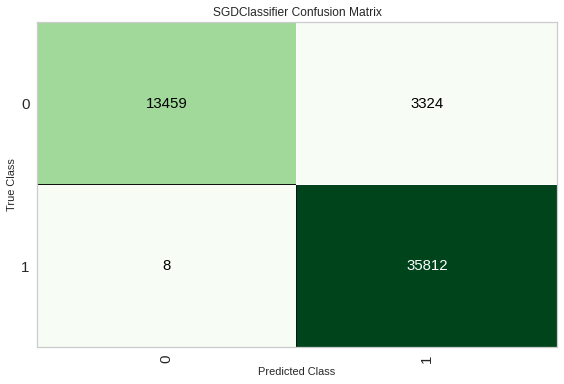

In [ ]:
plot_model(tuned_svm, plot = 'confusion_matrix')

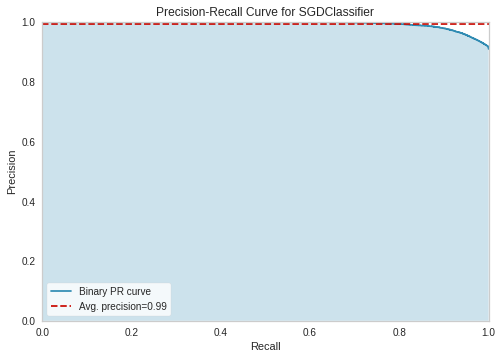

In [ ]:
plot_model(tuned_svm, plot = 'pr')

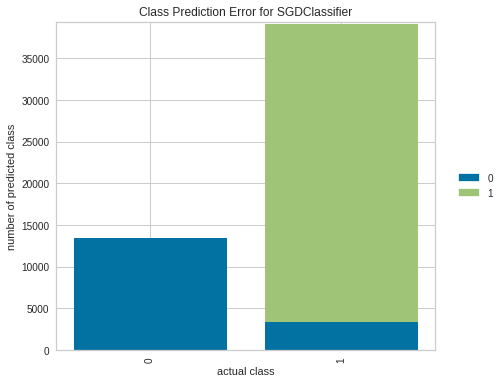

In [ ]:
plot_model(tuned_svm, plot = 'error')

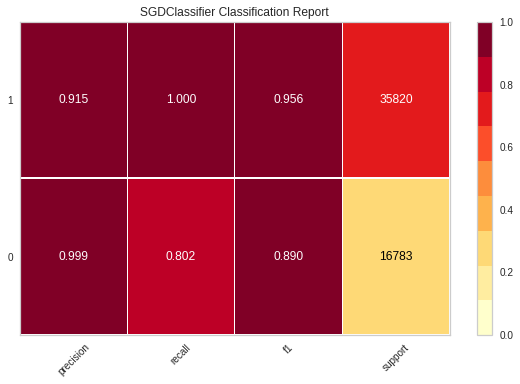

In [ ]:
plot_model(tuned_svm, plot = 'class_report')

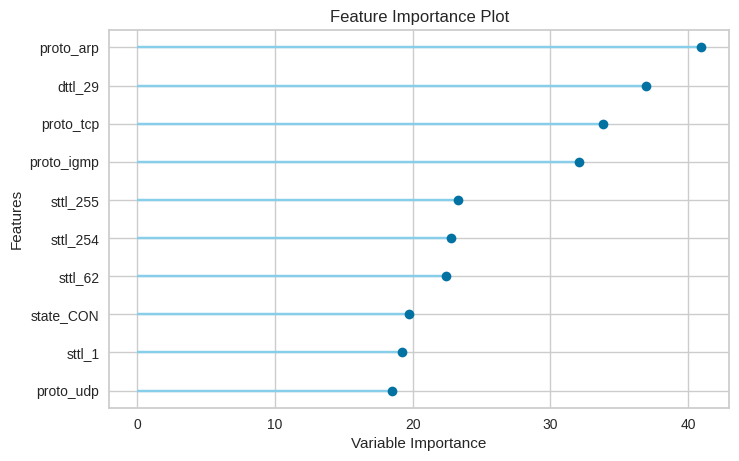

In [ ]:
plot_model(tuned_svm, plot = 'feature')

In [ ]:
# Predict on Test/Hold Sample

predict_model(tuned_svm);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9367,0.9009,0.9998,0.9151,0.9555,0.8461,0.8562


In [ ]:
tuned_svm_unseen_predictions = predict_model(tuned_svm, data=test)
tuned_svm_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(tuned_svm_unseen_predictions['label'], tuned_svm_unseen_predictions['Label'], metric = 'Accuracy')

0.8105

In [ ]:
###       BLENDING MODELS       ###

In [ ]:
blender_specific = blend_models(estimator_list = [general_model_dt,general_model_rf,general_model_knn,general_model_gbc], method = 'soft')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9549,0.9929,0.9737,0.9605,0.9671,0.8954,0.8956
1,0.9555,0.9929,0.9739,0.9612,0.9675,0.8969,0.8971
2,0.9554,0.9927,0.9753,0.9598,0.9675,0.8966,0.8969
3,0.9559,0.9931,0.9770,0.9590,0.9679,0.8976,0.8980
4,0.9530,0.9922,0.9740,0.9576,0.9658,0.8908,0.8912
5,0.9557,0.9931,0.9764,0.9592,0.9677,0.8970,0.8974
6,0.9571,0.9930,0.9770,0.9606,0.9687,0.9003,0.9006
7,0.9532,0.9924,0.9747,0.9572,0.9659,0.8911,0.8915
8,0.9531,0.9923,0.9745,0.9574,0.9659,0.8912,0.8915
9,0.9531,0.9922,0.9734,0.9583,0.9658,0.8911,0.8914


In [ ]:
blender_specific = blend_models(estimator_list = [general_model_dt,general_model_rf,general_model_knn,general_model_gbc,general_model_ada,general_model_lr], method = 'soft')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9564,0.9928,0.9783,0.9585,0.9683,0.8986,0.8991
1,0.9573,0.9928,0.9787,0.9594,0.9689,0.9007,0.9012
2,0.9547,0.9926,0.9777,0.9567,0.9671,0.8945,0.8951
3,0.9554,0.9930,0.9800,0.9556,0.9677,0.8960,0.8968
4,0.9531,0.9920,0.9783,0.9539,0.9660,0.8905,0.8912
5,0.9553,0.9931,0.9811,0.9545,0.9676,0.8955,0.8964
6,0.9567,0.9928,0.9801,0.9572,0.9685,0.8990,0.8996
7,0.9543,0.9923,0.9798,0.9543,0.9669,0.8933,0.8941
8,0.9540,0.9922,0.9788,0.9548,0.9667,0.8928,0.8935
9,0.9542,0.9921,0.9789,0.9549,0.9668,0.8932,0.8939


In [ ]:
blender_specific_unseen_predictions = predict_model(blender_specific, data=test)
blender_specific_unseen_predictions.head()
from pycaret.utils import check_metric
check_metric(blender_specific_unseen_predictions['label'], blender_specific_unseen_predictions['Label'], metric = 'Accuracy')

0.8602